# Leaky mode + SDP representation of Hollow Core guide Propagation

For case where walls are of different thicknesses

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from slab import SlabExact
from scipy.optimize import newton
from scipy.integrate import quad
plt.style.use('dark_background')
%matplotlib widget

# Setup Waveguide and input fields

In [2]:
Ts = [6.5, 2, 14, 3, 6.5]

A = SlabExact(scale=1e-5, Ts=Ts,
              ns=[1, 1.44, 1, 1.44, 1], xrefs=[200, 200, 400, 200, 200],
              symmetric=True)

In [3]:
b = 1.25

def quadratic_piecewise(x):
    conds = [(x<-b), ((-b<=x)*(x<=b)), (x>b)]
    funcs = [0, lambda x: 1 - (x / b)**2, 0]
    return np.piecewise(x, conds, funcs)

f0 = quadratic_piecewise

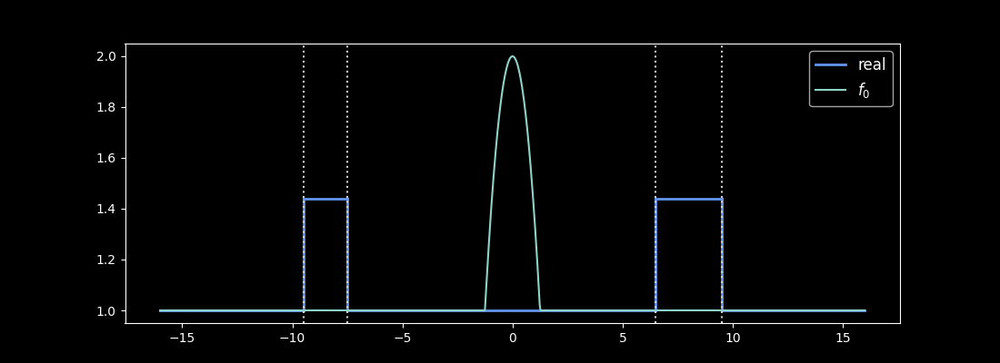

In [4]:
A.plot_refractive_index(color='cornflowerblue', linewidth=2);
A.add_1d_plot(lambda x: f0(x) + 1, label='$f_0$')

## Find Left and Right resonant wavelengths

In [5]:
resonant_wls_L = 2 * A.Ts[1] *  np.array([1/l for l in range(1,9)]) * np.sqrt(A.n_high**2 - A.n0**2) * A.scale
resonant_wls_R = 2 * A.Ts[3] *  np.array([1/l for l in range(1,9)]) * np.sqrt(A.n_high**2 - A.n0**2) * A.scale

print('shared wavelengths: ', set(resonant_wls_L).intersection(set(resonant_wls_R)))

shared wavelengths:  {2.072293415518179e-05, 1.0361467077590895e-05}


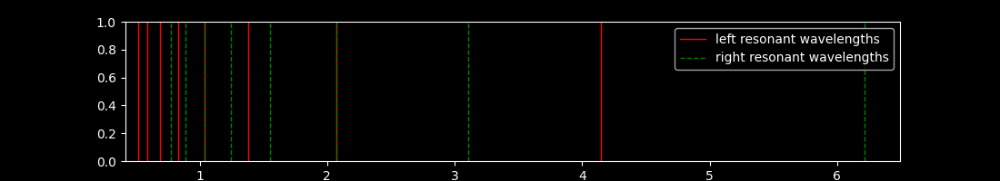

In [11]:
plt.close('all')
fig, ax = plt.subplots(1, figsize=(11,2))
ax.axvline(resonant_wls_L[0] / A.scale, linewidth=1, color='r', label='left resonant wavelengths')
ax.axvline(resonant_wls_R[0] / A.scale, linewidth=1, color='g', linestyle='--', label='right resonant wavelengths')

for r in resonant_wls_L[1:]:
    ax.axvline(r/A.scale, linewidth=1, color='r')
for r in resonant_wls_R[1:]:
    ax.axvline(r/A.scale, linewidth=1, color='g', linestyle='--')
plt.legend()

In [7]:
left_resonant_wl = resonant_wls_L[0]
right_resonant_wl = resonant_wls_R[1]
double_resonant_wl = resonant_wls_L[1]
low_loss_wl = (left_resonant_wl + right_resonant_wl)/2

left_resonant_wl, right_resonant_wl, low_loss_wl, double_resonant_wl

(4.144586831036358e-05,
 3.108440123277268e-05,
 3.626513477156813e-05,
 2.072293415518179e-05)

# Study

We note that guided fields likely won't play a role because we are either at low loss or at resonance, so guided modes are well contained to walls or cutoff.  May need to consider them when we are doing resonance at a single wall however.  We begin by studying the effects using just the leaky mode fields.

In [8]:

A = SlabExact(scale=1e-5, Ts=Ts,
              ns=[1, 1.44, 1, 1.44, 1], xrefs=[200, 200, 400, 200, 200],
              symmetric=True, wl=low_loss_wl)

L = SlabExact(scale=1e-5, Ts=Ts,
              ns=[1, 1.44, 1, 1.44, 1], xrefs=[200, 200, 400, 200, 200],
              symmetric=True, wl=left_resonant_wl)

R = SlabExact(scale=1e-5, Ts=Ts,
              ns=[1, 1.44, 1, 1.44, 1], xrefs=[200, 200, 400, 200, 200],
              symmetric=True, wl=right_resonant_wl)

D = SlabExact(scale=1e-5, Ts=Ts,
              ns=[1, 1.44, 1, 1.44, 1], xrefs=[200, 200, 400, 200, 200],
              symmetric=True, wl=double_resonant_wl)

# Low loss field

Propagation with this one is hard, so we opt for finding the leaky field.

## Guided portion

Surprisingly, this one has a non-trivial guided portion.

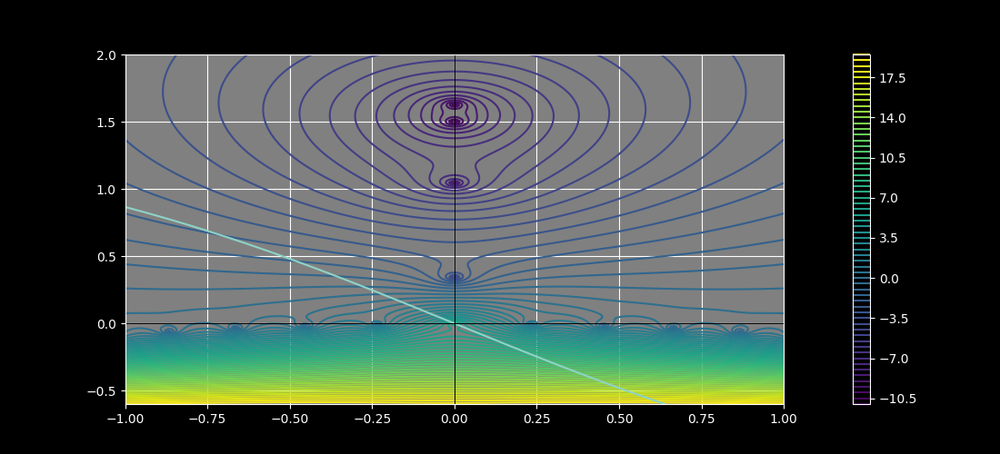

In [12]:
A.determinant_plot(-1, 1, -.6, 2);

In [13]:
Zg = newton(A.determinant_Z, np.array(.3j))
Fg = A.fields_Z(Zg)

alpha = quad(lambda x: f0(x) * Fg(x), -b, b, complex_func=True)[0]  / quad(lambda x: Fg(x) * Fg(x), -12, 12, complex_func=True)[0]

x0 = 0
z0 = 0
guided_x = lambda x: alpha * Fg(x, z0)
guided_z = lambda z: alpha * Fg(x0, z)[:,0]
Guided = lambda x, z: alpha * Fg(x, z)

(<Figure size 1200x500 with 1 Axes>, <Axes: >)

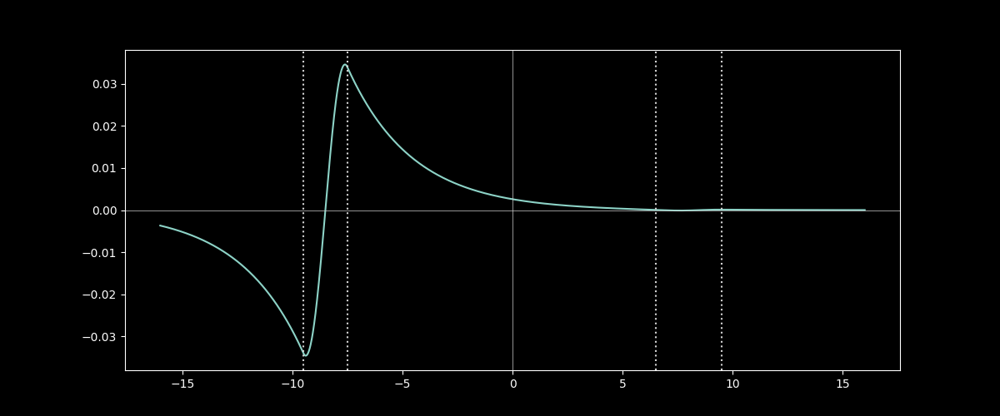

In [14]:
A.plot_field_1d(guided_x)

## Radiation field propagation

In [15]:
Propagator_ClassA = A.propagator()


In [16]:
contour = A.real_contour(0.000001, .38, 100)

P_prop1Ae = Propagator_ClassA(contour, f0=f0, Lx=-b, Rx=b)
P_prop1Ao = Propagator_ClassA(contour, f0=f0, Lx=-b, Rx=b, sign='-1')


In [17]:
contour = A.real_contour(.38, .435, 100)

P_prop2Ae = Propagator_ClassA(contour, f0=f0, Lx=-b, Rx=b)
P_prop2Ao = Propagator_ClassA(contour, f0=f0, Lx=-b, Rx=b, sign='-1')


In [18]:
contour = A.real_contour(.435, A.Z_evanescent.real, 300)

P_prop3Ae = Propagator_ClassA(contour, f0=f0, Lx=-b, Rx=b)
P_prop3Ao = Propagator_ClassA(contour, f0=f0, Lx=-b, Rx=b, sign='-1')


(<Figure size 1100x400 with 1 Axes>, <Axes: >)

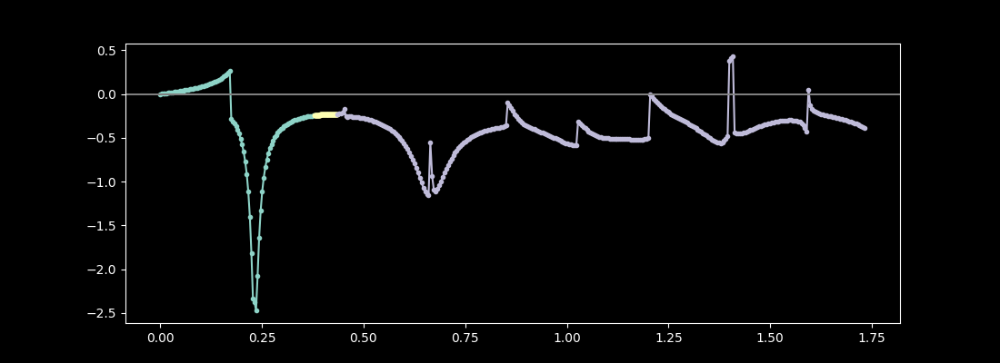

In [19]:
P_prop1Ae.plot_transform()
P_prop2Ae.plot_transform(ax=plt.gca())
P_prop3Ae.plot_transform(ax=plt.gca())

## Evanescent Portion

In [20]:
contour = A.real_contour(A.Z_evanescent.real, 7, 100)

P_ev1Ae = Propagator_ClassA(contour, f0=f0, Lx=-b, Rx=b)
P_ev1Ao = Propagator_ClassA(contour, f0=f0, Lx=-b, Rx=b, sign='-1')


(<Figure size 1100x400 with 1 Axes>, <Axes: >)

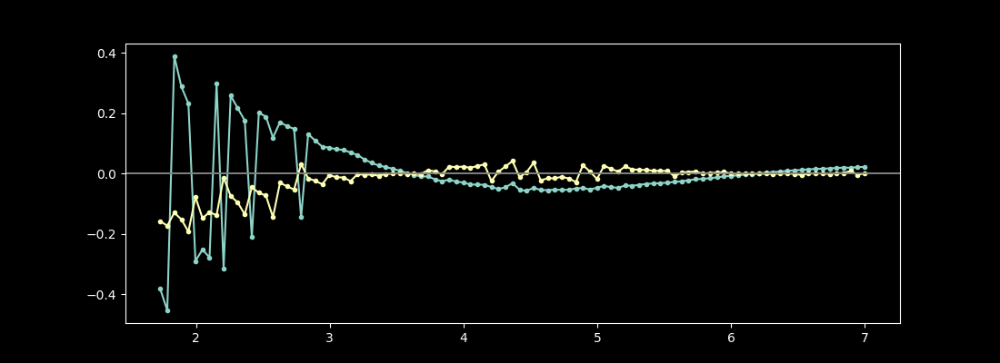

In [21]:
P_ev1Ae.plot_transform()
P_ev1Ao.plot_transform(ax=plt.gca())

In [22]:
contour = A.real_contour(7, 14, 100)

P_ev2Ae = Propagator_ClassA(contour, f0=f0, Lx=-b, Rx=b)
P_ev2Ao = Propagator_ClassA(contour, f0=f0, Lx=-b, Rx=b, sign='-1')


(<Figure size 1100x400 with 1 Axes>, <Axes: >)

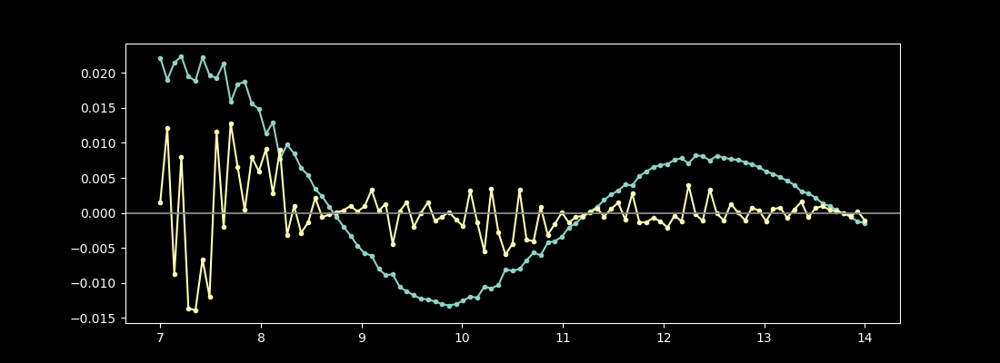

In [23]:
P_ev2Ae.plot_transform()
P_ev2Ao.plot_transform(ax=plt.gca())

## Functions and Plots

In [24]:
propfuncsA = [
    P_prop1Ae,
    P_prop1Ao,
    P_prop2Ae,
    P_prop2Ao,
    P_prop3Ae,
    P_prop3Ao,
]

evfuncsA = [
    P_ev1Ae,
    P_ev1Ao,
    P_ev2Ae,
    P_ev2Ao,
]

In [25]:
x0 = 0
z0 = 0

propA_x = lambda x: sum([f.slice_propagate(x, z0, 'z') for f in propfuncsA])
evA_x = lambda x: sum([f.slice_propagate(x, z0, 'z') for f in evfuncsA]) 
fullA_x = lambda x: propA_x(x) + evA_x(x) + guided_x(x)

propA_z = lambda z: sum([f.slice_propagate(z, x0, 'x') for f in propfuncsA])
evA_z = lambda z: sum([f.slice_propagate(z, x0, 'x') for f in evfuncsA]) 
fullA_z = lambda z: propA_z(z) + evA_z(z) + guided_z(z)

diffA_x = lambda x: f0(x) - fullA_x(x)

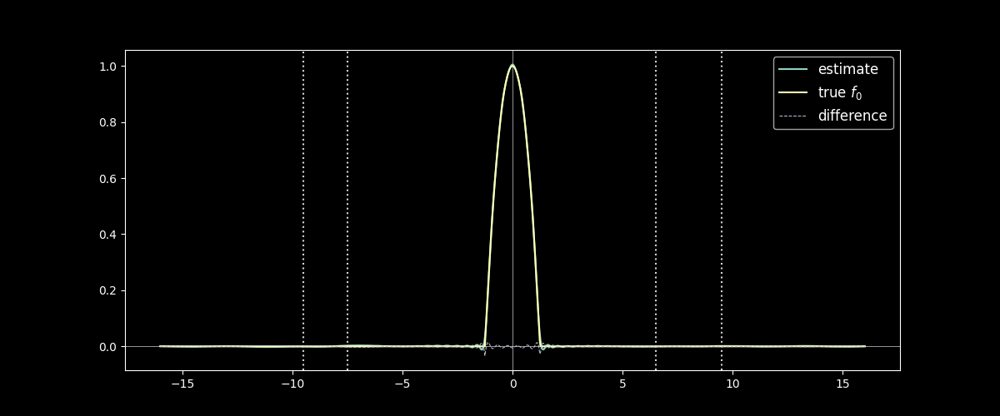

In [26]:
A.plot_field_1d(fullA_x, label='estimate') 
A.add_1d_plot(f0, label='true $f_0$')
A.add_1d_plot(diffA_x, label='difference', linewidth=.75, linestyle='--')
# plt.gca().set_xlim(-3,3)

In [27]:
PropA = lambda x, z: sum([f.propagate(x, z) for f in propfuncsA])
EvA = lambda x, z: sum([f.propagate(x, z) for f in evfuncsA]) 
FullA = lambda x, z: PropA(x, z) + EvA(x, z) + Guided(x, z)

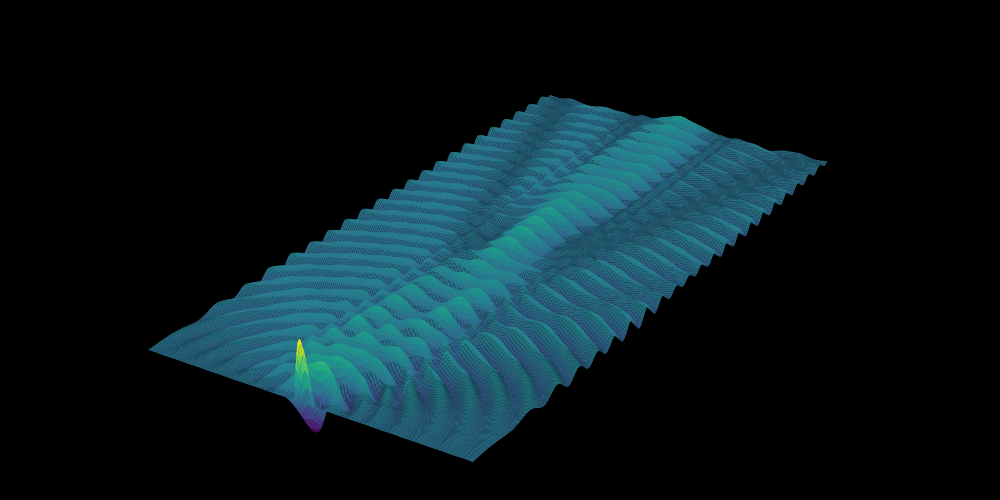

In [28]:
A.plot_field_2d_surface(FullA, xs=np.linspace(-25, 25, 200), zs=np.linspace(0, 100, 400),
                       zoom=2.5, elev=27, azim=-58, rstride=1, cstride=1);

## Leaky Modes

We note again that the leaky modes associated with Z values with positive real part and negative imaginary part yield trivial fields when contour integrals are taken around them.  If we negate the Z values, we get non-trival fields with the correct direction of decay (decay in positive z-direction).  This is still a mystery.

## New observations

Part of the reason for this is that the pole locations associated in the right lower half plane are not given by entries of the transmission matrix directly.  We would need to figure out a new eigenvalue equation for them.


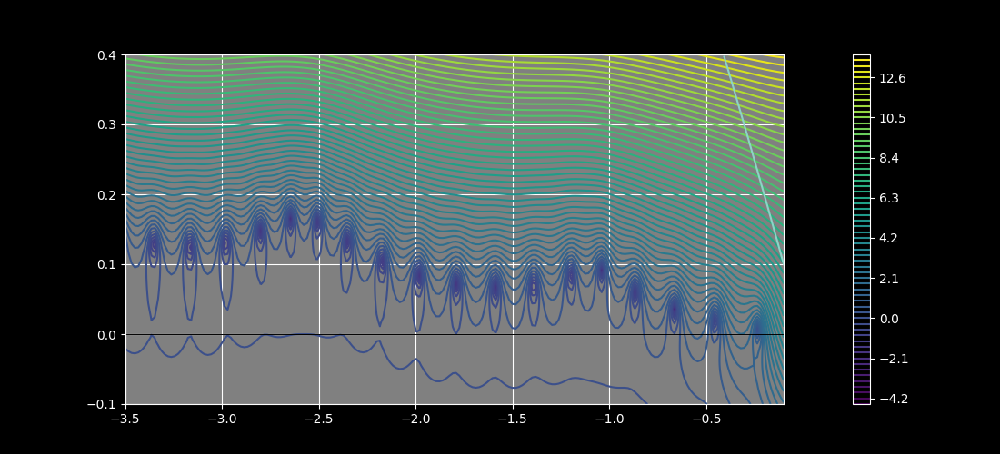

In [177]:
A.determinant_plot(-3.5, -.1, -.1, .4, mode_type='leaky', plot_y_axis=False);

In [174]:
# A.interactive_spectral_integrand_2d(f0, Lx=-b, Rx=b, rmin=.22, rmax=.24, imin=-.015, imax=.015, rref=80, iref=80)

In [175]:
guesses_A = -np.array([
    .25,
    .45, .65, .86-.06j,
    1.-.1j, 1.2-.08j, 1.4-.07j, 1.58-.065j,
    1.8-.07j, 2-.08j, 2.2-.1j, 2.38-.13j,
    2.5-.17j, 2.65-.17j, 2.8-.15j, 3-.13j,
    3.2-.125j,
])

In [176]:
Z_leaky_A = [newton(A.determinant_Z, np.array(guess), args=('TE', 'leaky')) for guess in guesses_A]
for Z in Z_leaky_A:
    plt.plot(Z.real, Z.imag, marker='o', markersize=5)

In [170]:
P_leaky_A = [Propagator_ClassA(A.circular_contour(Z, 1e-6, 5), f0=f0, Lx=-b, Rx=b) for Z in Z_leaky_A]
P_leaky_A.extend([Propagator_ClassA(A.circular_contour(Z, 1e-6, 5), f0=f0, Lx=-b, Rx=b, sign=-1) for Z in Z_leaky_A])

Wait, so am I just barely capturing the pole here?

In [171]:
x0 = 0
z0 = 0

leaky_A_x = lambda x: sum([P.slice_propagate(x, z0, 'z') for P in P_leaky_A])
leaky_A_z = lambda z: sum([P.slice_propagate(z, x0, 'x') for P in P_leaky_A])
Leaky_A = lambda x, z: sum([P.propagate(x, z) for P in P_leaky_A])

Diff_Leaky_Full_A = lambda x,z: FullA(x,z) - Leaky_A(x,z)

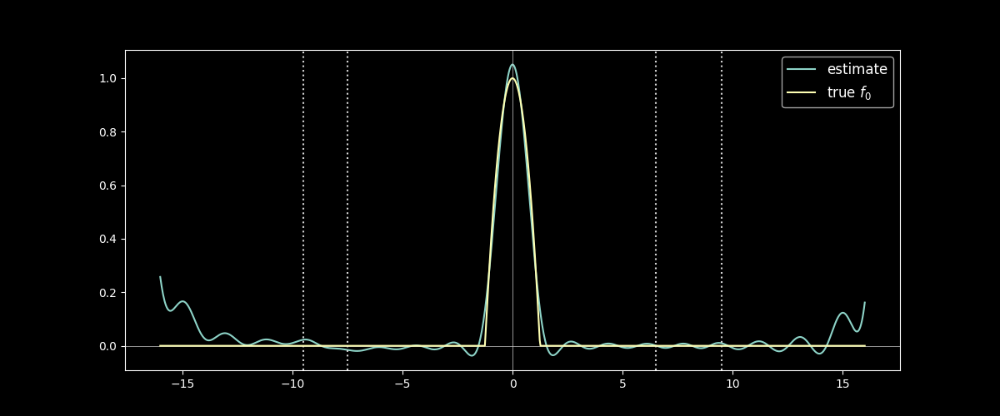

In [172]:
A.plot_field_1d(leaky_A_x, label='estimate') 
A.add_1d_plot(f0, label='true $f_0$')
# plt.gca().set_xlim(-3,3)

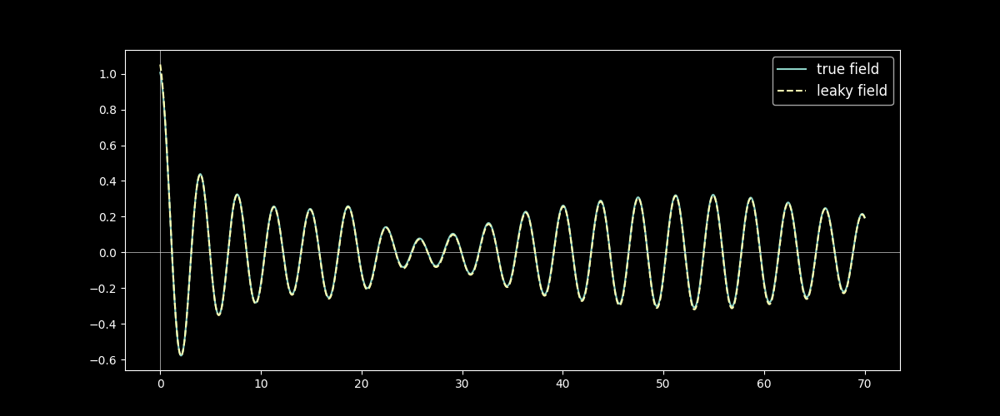

In [129]:
A.plot_field_1d(fullA_z, xs=np.linspace(0, 70, 1000), label='true field', plot_Rhos=False) 
A.add_1d_plot(leaky_A_z, xs=np.linspace(0, 70, 1000), label='leaky field', ls='--')
# plt.gca().set_xlim(-3,3)

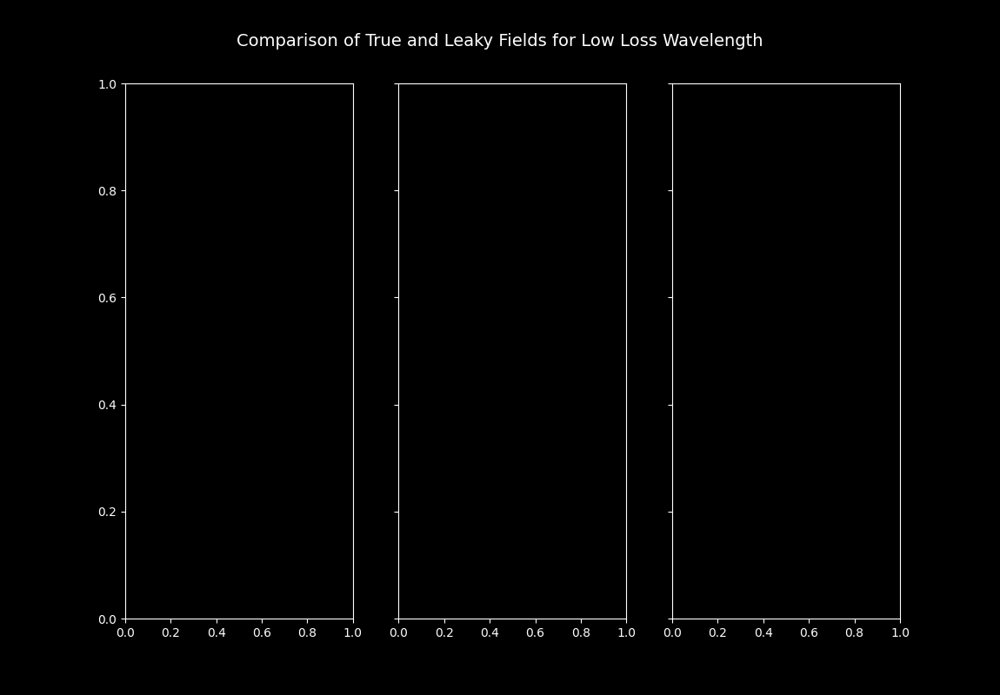

In [130]:
plt.close('all')
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, sharey=True, figsize=(11.5,8))

xs = np.linspace(-25, 25, 100)
zs = np.linspace(0, 140, 200)
levels = 50
vmin, vmax = -1, 1
Rho_lineargs = {'lw': .125, 'ls': '-', 'c': 'k'}
fig.suptitle('\nComparison of True and Leaky Fields for Low Loss Wavelength\n', fontsize=14);

In [131]:
A.add_2d_plot(FullA, ax=ax1, xs=xs, zs=zs,
              vmin=vmin, vmax=vmax,
              colorbar=True);
ax1.set_title('True Field')

Text(0.5, 1.0, 'True Field')

In [132]:
A.add_2d_plot(Leaky_A, ax=ax2, xs=xs, zs=zs,
              vmin=vmin, vmax=vmax,
              colorbar=True);
ax2.set_title('Leaky Field')

Text(0.5, 1.0, 'Leaky Field')

In [133]:
A.add_2d_plot(Diff_Leaky_Full_A, ax=ax3, xs=xs, zs=zs, part='norm', colorbar=True);
ax3.set_title('Norm of Difference')

Text(0.5, 1.0, 'Norm of Difference')

## Low Loss field Observations

Leaky modes model this field well.  No need for space wave or asymptotics.

# Left Resonant Field

The leaky mode representation likely doesn't work as well here, but in what way?

In [53]:
Propagator_ClassL = L.propagator()

## Find true field via propagation

In [54]:
contour = L.real_contour(0.0000001, L.Z_evanescent.real, 9000)

P_prop1Le = Propagator_ClassL(contour, f0=f0, Lx=-b, Rx=b)
P_prop1Lo = Propagator_ClassL(contour, f0=f0, Lx=-b, Rx=b, sign='-1')


(<Figure size 1100x400 with 1 Axes>, <Axes: >)

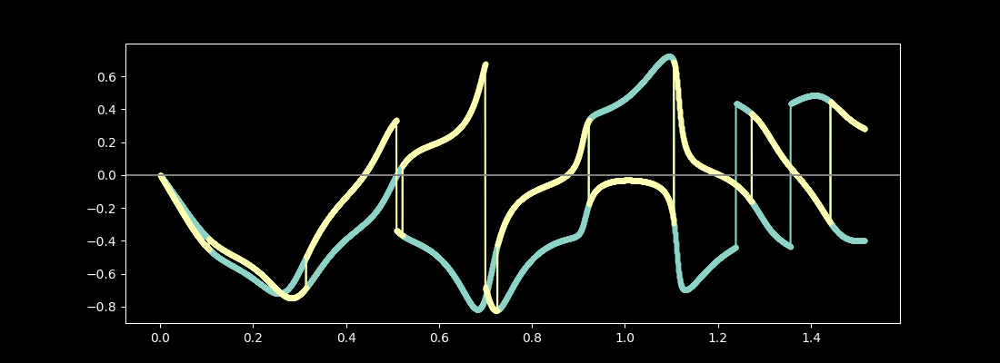

In [55]:
P_prop1Le.plot_transform()
P_prop1Lo.plot_transform(ax=plt.gca())

In [56]:
contour = L.real_contour(L.Z_evanescent.real, 2, 1000)

P_ev1Le = Propagator_ClassL(contour, f0=f0, Lx=-b, Rx=b)
P_ev1Lo = Propagator_ClassL(contour, f0=f0, Lx=-b, Rx=b, sign='-1')


(<Figure size 1100x400 with 1 Axes>, <Axes: >)

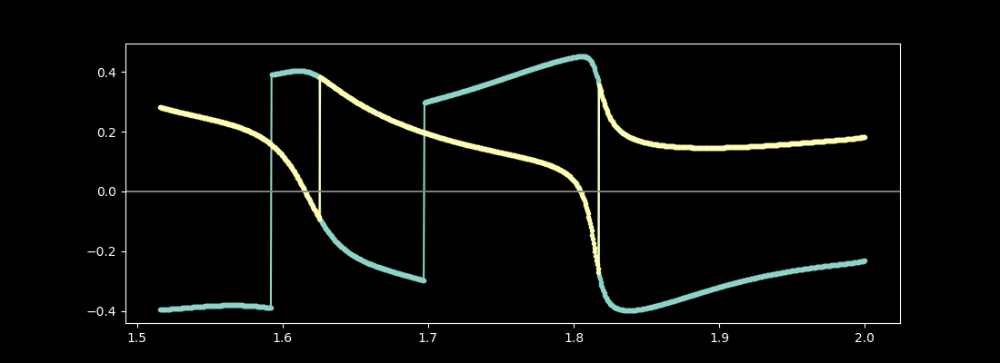

In [57]:
P_ev1Le.plot_transform()
P_ev1Lo.plot_transform(ax=plt.gca())

In [58]:
contour = L.real_contour(2, 6, 1000)

P_ev2Le = Propagator_ClassL(contour, f0=f0, Lx=-b, Rx=b)
P_ev2Lo = Propagator_ClassL(contour, f0=f0, Lx=-b, Rx=b, sign='-1')


(<Figure size 1100x400 with 1 Axes>, <Axes: >)

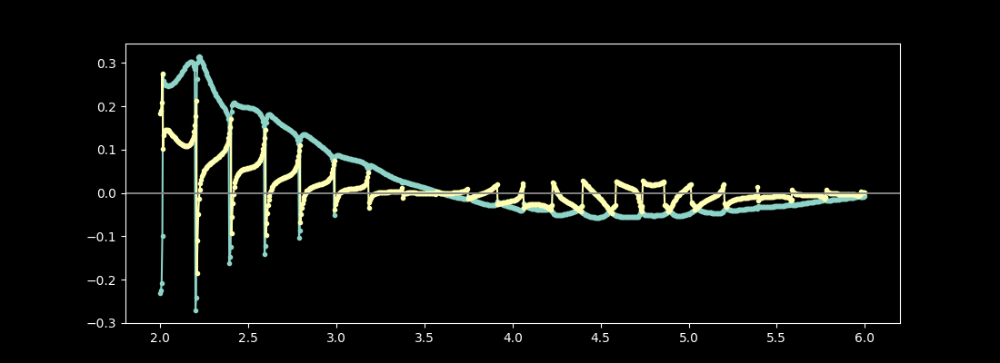

In [59]:
P_ev2Le.plot_transform()
P_ev2Lo.plot_transform(ax=plt.gca())

In [60]:
contour = L.real_contour(6, 14, 1000)

P_ev3Le = Propagator_ClassL(contour, f0=f0, Lx=-b, Rx=b)
P_ev3Lo = Propagator_ClassL(contour, f0=f0, Lx=-b, Rx=b, sign='-1')


(<Figure size 1100x400 with 1 Axes>, <Axes: >)

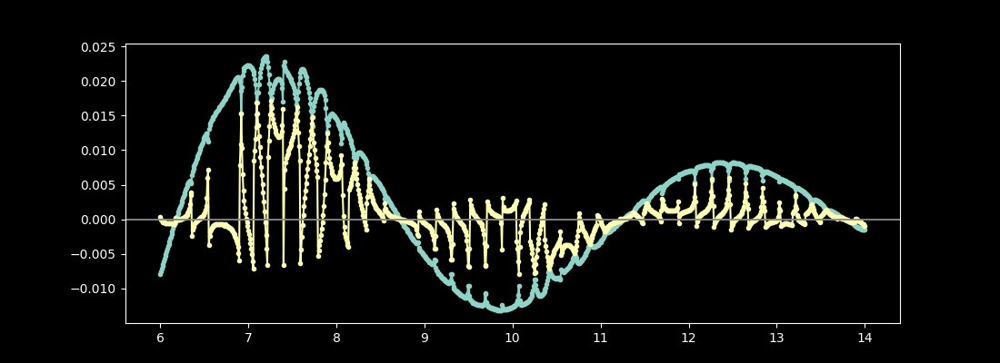

In [61]:
P_ev3Le.plot_transform()
P_ev3Lo.plot_transform(ax=plt.gca())

In [62]:
propfuncsL = [
    P_prop1Le,
    P_prop1Lo,
]

evfuncsL = [
    P_ev1Le,
    P_ev1Lo,
    P_ev2Le,
    P_ev2Lo,
    P_ev3Le,
    P_ev3Lo,
]

In [63]:
x0 = 0
z0 = 0

propL_x = lambda x: sum([f.slice_propagate(x, z0, 'z') for f in propfuncsL])
evL_x = lambda x: sum([f.slice_propagate(x, z0, 'z') for f in evfuncsL]) 
fullL_x = lambda x: propL_x(x) + evL_x(x)

propL_z = lambda z: sum([f.slice_propagate(z, x0, 'x') for f in propfuncsL])
evL_z = lambda z: sum([f.slice_propagate(z, x0, 'x') for f in evfuncsL]) 
fullL_z = lambda z: propL_z(z) + evL_z(z)

diffL_x = lambda x: f0(x) - fullL_x(x)

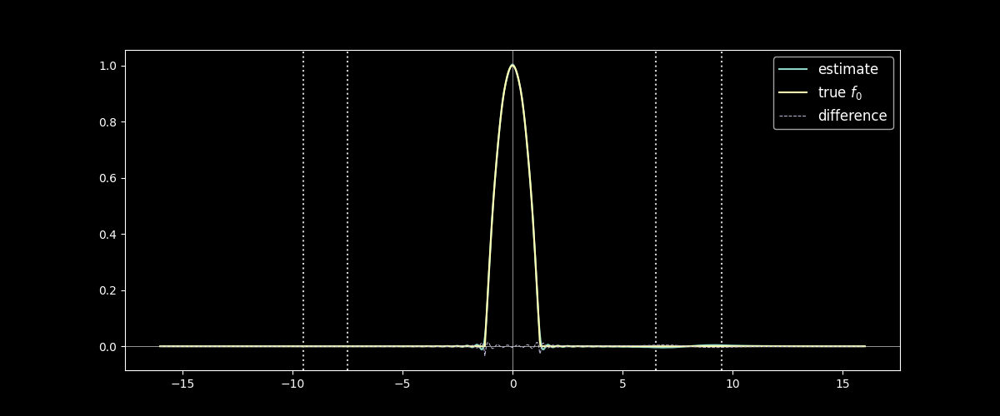

In [64]:
A.plot_field_1d(fullL_x, label='estimate') 
A.add_1d_plot(f0, label='true $f_0$')
A.add_1d_plot(diffL_x, label='difference', linewidth=.75, linestyle='--')
# plt.gca().set_xlim(-3,3)

In [65]:
PropL = lambda x, z: sum([f.propagate(x, z) for f in propfuncsL])
EvL = lambda x, z: sum([f.propagate(x, z) for f in evfuncsL]) 
FullL = lambda x, z: PropL(x, z) + EvL(x, z)

## Leaky Modes

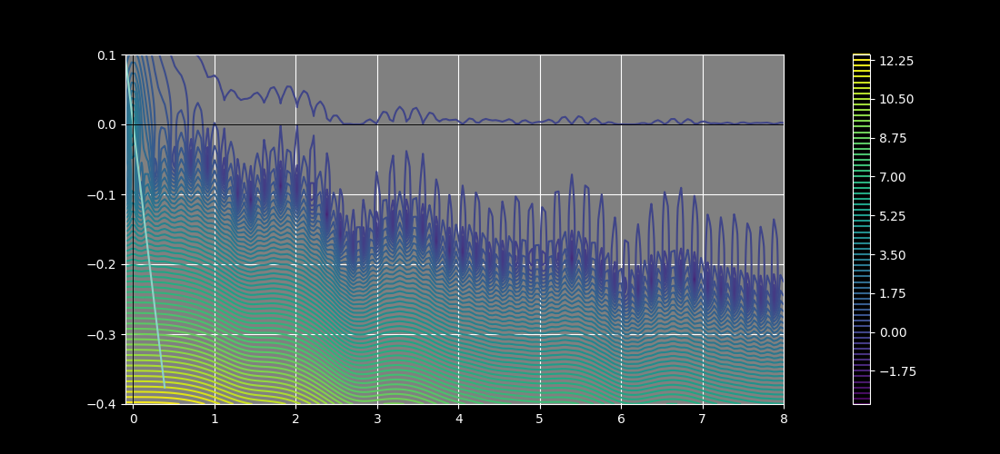

In [66]:
L.determinant_plot(-.1, 8, -.4, .1);

In [67]:
guesses_L = [
    # .1-.08j,
    .25-.06j, .5-.06j, .7-.05j, .9-.06j,
    1.1-.09j, 1.3-.1j, 1.45-.11j, 1.62-.09j,
    1.8-.09j, 2.-.1j, 2.2-.11j, 2.38-.13j,
    2.55-.16j, 2.7-.17j, 2.85-.17j, 3.-.15j,
    3.2-.14j, 3.4-.14j, 3.55-.15j, 3.75-.17j,
    3.9-.18j, 4.08 - .18j, 4.2-.18j, 4.4-.19j,
    4.55-.195j, 4.7-.19j, 4.9 - .19j, 5.05 - .2j,
    5.2-.19j, 5.4-.19j, 5.6-.19j, 5.75-.19j,
]

In [68]:
Z_leaky_L = [newton(L.determinant_Z, np.array(guess)) for guess in guesses_L]
for Z in Z_leaky_L:
    plt.plot(Z.real, Z.imag, marker='o', markersize=5)

In [69]:
P_leaky_L = [Propagator_ClassL(L.circular_contour(-Z, 1e-6, 12), f0=f0, Lx=-b, Rx=b) for Z in Z_leaky_L]
P_leaky_L.extend([Propagator_ClassL(L.circular_contour(-Z, 1e-6, 12), f0=f0, Lx=-b, Rx=b, sign=-1) for Z in Z_leaky_L])

In [70]:
x0 = -10
z0 = 0

propL_x = lambda x: sum([f.slice_propagate(x, z0, 'z') for f in propfuncsL])
evL_x = lambda x: sum([f.slice_propagate(x, z0, 'z') for f in evfuncsL]) 
fullL_x = lambda x: propL_x(x) + evL_x(x)

propL_z = lambda z: sum([f.slice_propagate(z, x0, 'x') for f in propfuncsL])
evL_z = lambda z: sum([f.slice_propagate(z, x0, 'x') for f in evfuncsL]) 
fullL_z = lambda z: propL_z(z) + evL_z(z)

diffL_x = lambda x: f0(x) - fullL_x(x)

leaky_L_x = lambda x: sum([P.slice_propagate(x, z0, 'z') for P in P_leaky_L])
leaky_L_z = lambda z: sum([P.slice_propagate(z, x0, 'x') for P in P_leaky_L])
Leaky_L = lambda x, z: sum([P.propagate(x, z) for P in P_leaky_L])

diff_leaky_full_L_x = lambda x: fullL_x(x) - leaky_L_x(x)
Diff_Leaky_Full_L = lambda x,z: FullL(x,z) - Leaky_L(x,z)

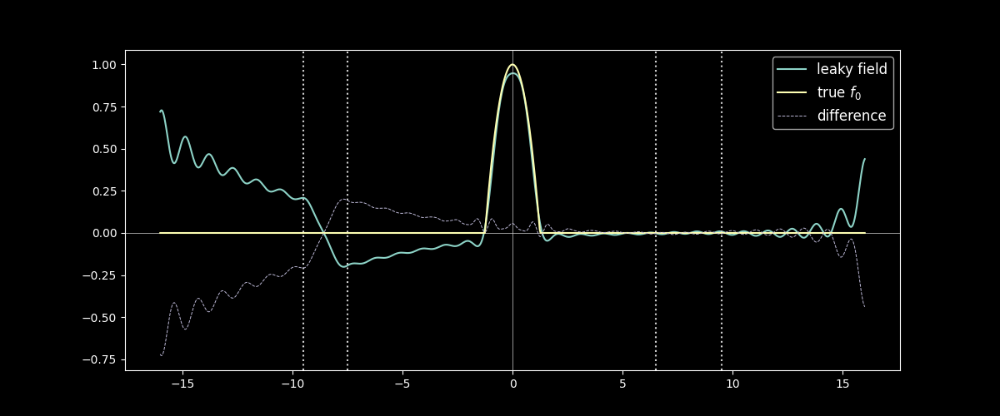

In [73]:
A.plot_field_1d(leaky_L_x, label='leaky field') 
A.add_1d_plot(f0, label='true $f_0$')
A.add_1d_plot(diff_leaky_full_L_x, label='difference', linestyle='--', lw=.7)
# plt.gca().set_xlim(-3,3)

Text(0.5, 0, 'z')

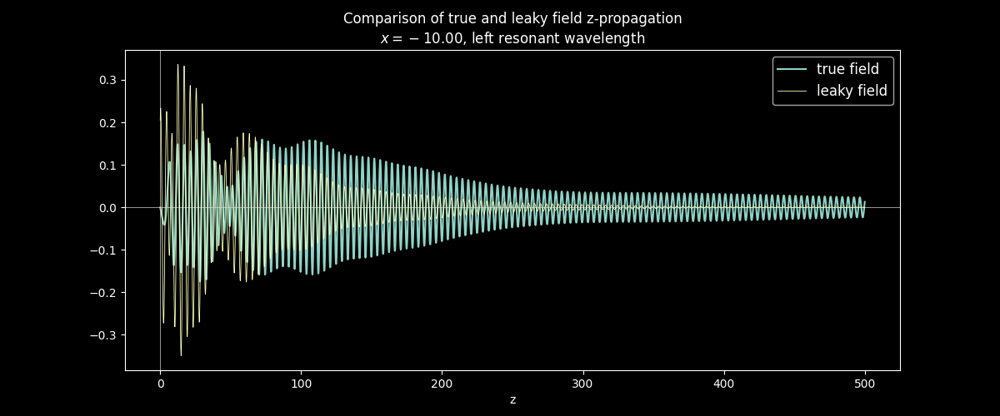

In [72]:
fig, ax = A.plot_field_1d(fullL_z, xs=np.linspace(0, 500, 5000), label='true field', plot_Rhos=False) 
A.add_1d_plot(leaky_L_z, xs=np.linspace(0, 500, 5000), label='leaky field', lw=.6)
ax.set_title('Comparison of true and leaky field z-propagation\n$x=%.2f$, left resonant wavelength'%x0)
ax.set_xlabel('z')

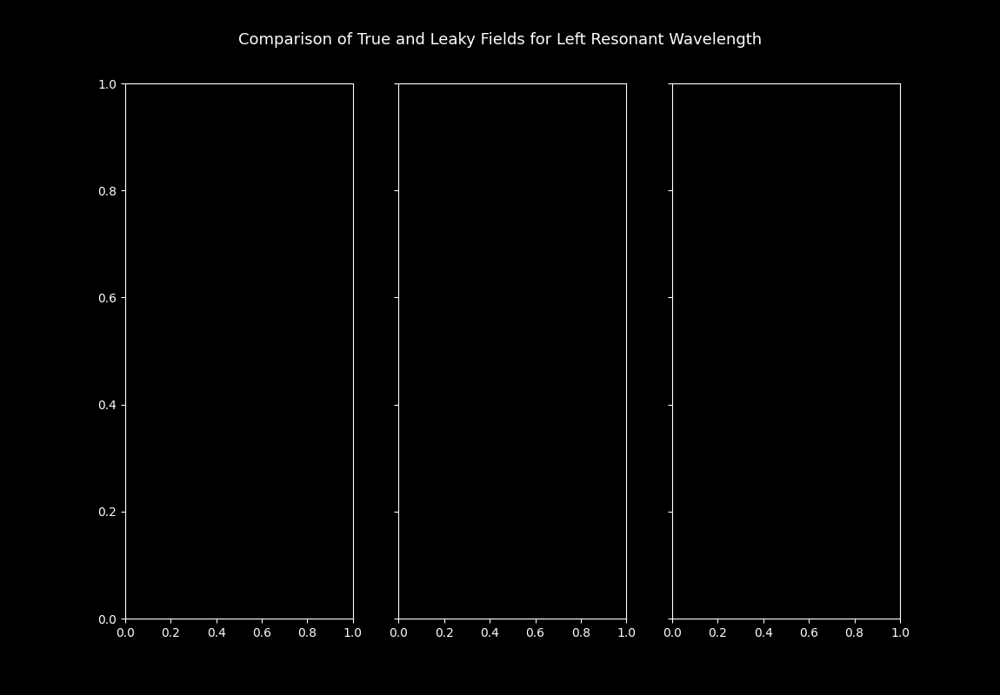

In [74]:
plt.close('all')
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, sharey=True, figsize=(11.5,8))

xs = np.linspace(-25, 25, 100)
zs = np.linspace(0, 140, 200)

vmin, vmax = -1, 1
Rho_lineargs = {'lw': .125, 'ls': '-', 'c': 'k'}
fig.suptitle('\nComparison of True and Leaky Fields for Left Resonant Wavelength\n', fontsize=13);

In [75]:
A.add_2d_plot(FullL, ax=ax1, xs=xs, zs=zs,
              vmin=vmin, vmax=vmax,
              levels=50, colorbar=True);
ax1.set_title('True Field')

Text(0.5, 1.0, 'True Field')

In [76]:
A.add_2d_plot(Leaky_L, ax=ax2, xs=xs, zs=zs,
              vmin=vmin, vmax=vmax,
              levels=50, colorbar=True);
ax2.set_title('Leaky Field')

Text(0.5, 1.0, 'Leaky Field')

In [77]:
A.add_2d_plot(Diff_Leaky_Full_L, ax=ax3, xs=xs, zs=zs, part='norm', levels=50, colorbar=True);
ax3.set_title('Norm of Difference')

Text(0.5, 1.0, 'Norm of Difference')

## Observations

The leaky mode field now models the true field less well, especially in the left hand region.  At z=0, the input pattern of the leaky modes is matching f0 less well on the left, but relatively well on the right (about as well as low loss wavelength).

For z-propagation, it also seems the leaky field matches the true field better on the right side, though for both sides it appears the decay of the leaky field is too great.


## Space wave via SDP integration

In [78]:
contour = L.sdp_contour(0.000001, .15, 2000, sdp_sign=-1)
P_sdp_L_1e = Propagator_ClassL(contour, f0=f0, Lx=-b, Rx=b)
P_sdp_L_1o = Propagator_ClassL(contour, f0=f0, Lx=-b, Rx=b, sign=-1)

(<Figure size 1100x400 with 1 Axes>, <Axes: >)

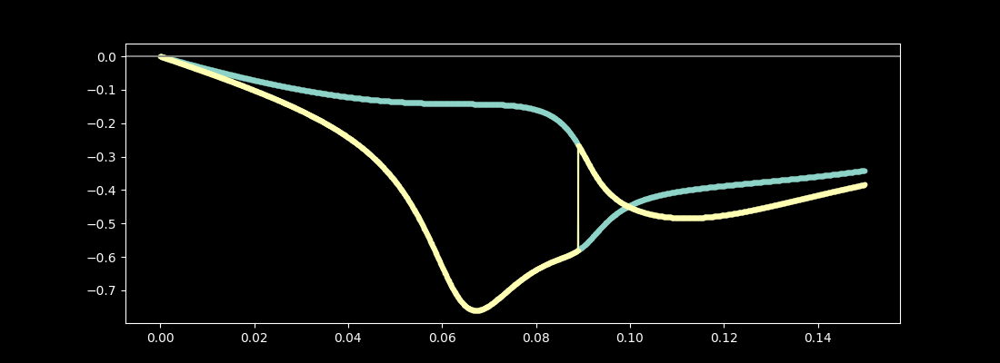

In [79]:
P_sdp_L_1e.plot_transform()
P_sdp_L_1o.plot_transform(ax=plt.gca())

In [80]:
contour = L.sdp_contour(.15,.28, 500, sdp_sign=-1)
P_sdp_L_2e = Propagator_ClassL(contour, f0=f0, Lx=-b, Rx=b)
P_sdp_L_2o = Propagator_ClassL(contour, f0=f0, Lx=-b, Rx=b, sign=-1)

(<Figure size 1100x400 with 1 Axes>, <Axes: >)

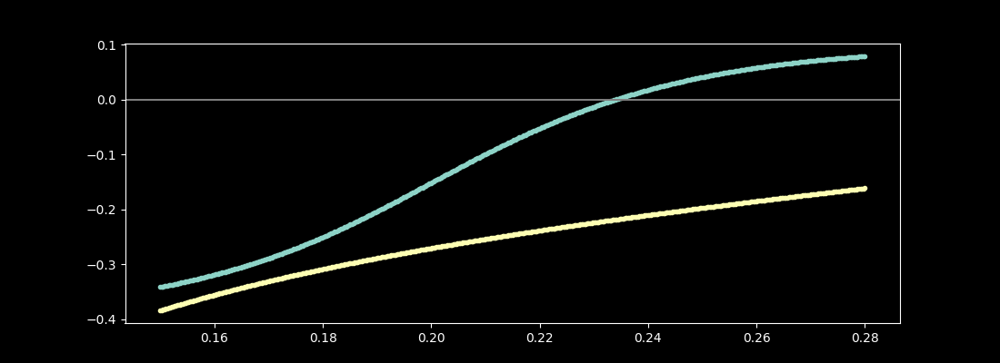

In [81]:
P_sdp_L_2e.plot_transform()
P_sdp_L_2o.plot_transform(ax=plt.gca())

In [82]:
contour = L.sdp_contour(.28, 1, 500, sdp_sign=-1)
P_sdp_L_3e = Propagator_ClassL(contour, f0=f0, Lx=-b, Rx=b)
P_sdp_L_3o = Propagator_ClassL(contour, f0=f0, Lx=-b, Rx=b, sign=-1)

(<Figure size 1100x400 with 1 Axes>, <Axes: >)

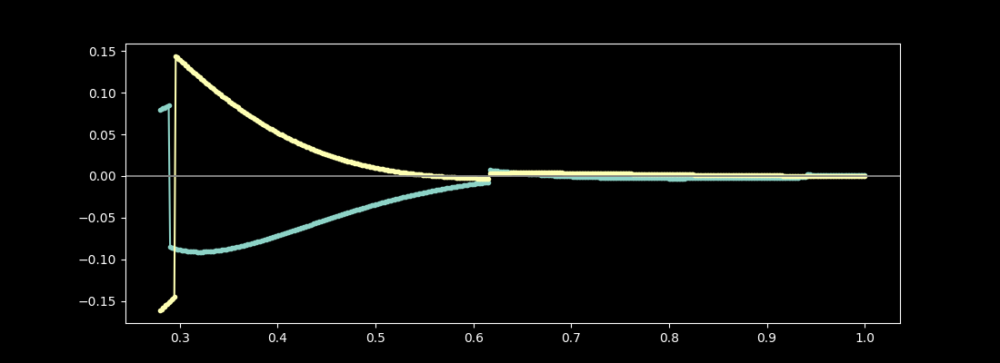

In [83]:
P_sdp_L_3e.plot_transform()
P_sdp_L_3o.plot_transform(ax=plt.gca())

In [84]:
P_sdps_L = [
    P_sdp_L_1e,
    P_sdp_L_1o,
    P_sdp_L_2e,
    P_sdp_L_2o,
    P_sdp_L_3e,
    P_sdp_L_3o,
]

In [85]:
x0 = -12
z0 = 0


propL_x = lambda x: sum([f.slice_propagate(x, z0, 'z') for f in propfuncsL])
evL_x = lambda x: sum([f.slice_propagate(x, z0, 'z') for f in evfuncsL]) 
fullL_x = lambda x: propL_x(x) + evL_x(x)

propL_z = lambda z: sum([f.slice_propagate(z, x0, 'x') for f in propfuncsL])
evL_z = lambda z: sum([f.slice_propagate(z, x0, 'x') for f in evfuncsL]) 
fullL_z = lambda z: propL_z(z) + evL_z(z)

diffL_x = lambda x: f0(x) - fullL_x(x)


leaky_L_x = lambda x: sum([P.slice_propagate(x, z0, 'z') for P in P_leaky_L])
leaky_L_z = lambda z: sum([P.slice_propagate(z, x0, 'x') for P in P_leaky_L])
Leaky_L = lambda x, z: sum([P.propagate(x, z) for P in P_leaky_L])

diff_leaky_full_L_x = lambda x: fullL_x(x) - leaky_L_x(x)
Diff_Leaky_Full_L = lambda x,z: FullL(x,z) - Leaky_L(x,z)

sdp_L_x = lambda x: sum([P.slice_propagate(x, z0, 'z') for P in P_sdps_L])
sdp_L_z = lambda z: sum([P.slice_propagate(z, x0, 'x') for P in P_sdps_L])
Sdp_L = lambda x, z: sum([P.propagate(x, z) for P in P_sdps_L])

leaky_sdp_L_x = lambda x: leaky_L_x(x) + sdp_L_x(x)
leaky_sdp_L_z = lambda z: leaky_L_z(z) + sdp_L_z(z)
Leaky_Sdp_L = lambda x, z: Leaky_L(x,z) + Sdp_L(x, z)

Diff_Leaky_SDP_Full_L = lambda x,z: FullL(x,z) - Leaky_Sdp_L(x,z)

(-3.0, 3.0)

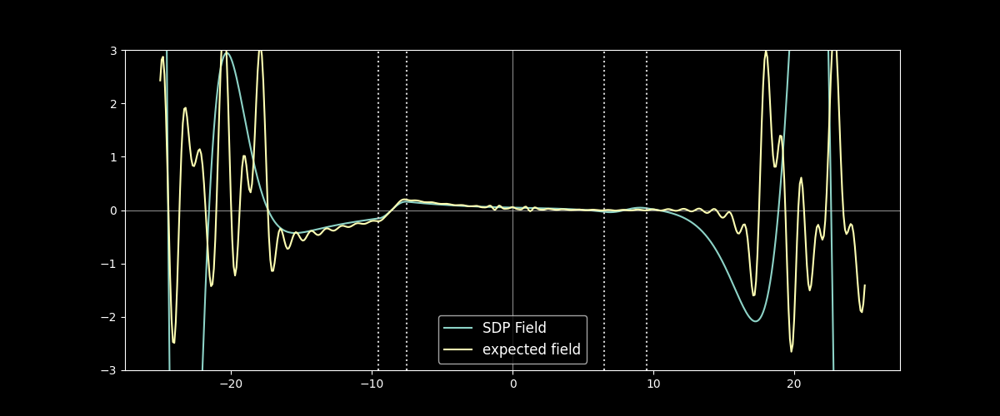

In [86]:
L.plot_field_1d(sdp_L_x, xs=np.linspace(-25, 25, 500), label='SDP Field')
L.add_1d_plot(diff_leaky_full_L_x, xs=np.linspace(-25, 25, 500), label='expected field')
plt.gca().set_ylim(-3,3)

## Left side z-propagation asymptotics

Text(0.5, 0, 'z')

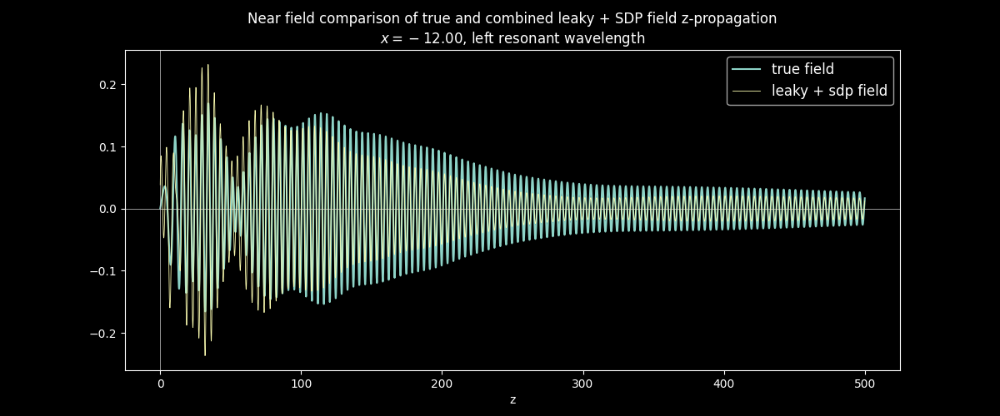

In [87]:
fig, ax = A.plot_field_1d(fullL_z, xs=np.linspace(0, 500, 5000), label='true field', plot_Rhos=False) 
A.add_1d_plot(leaky_sdp_L_z, xs=np.linspace(0, 500, 5000), label='leaky + sdp field', lw=.6)
ax.set_title('Near field comparison of true and combined leaky + SDP field z-propagation\n$x=%.2f$, left resonant wavelength'%x0)
ax.set_xlabel('z')

(-0.04, 0.04)

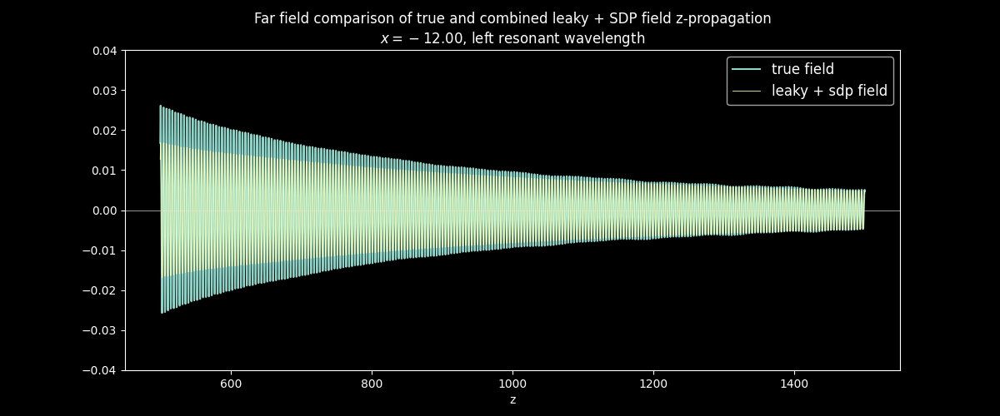

In [88]:
fig, ax = A.plot_field_1d(fullL_z, xs=np.linspace(500, 1500, 5000), label='true field', plot_Rhos=False) 
A.add_1d_plot(leaky_sdp_L_z, xs=np.linspace(500, 1500, 5000), label='leaky + sdp field', lw=.6)
ax.set_title('Far field comparison of true and combined leaky + SDP field z-propagation\n$x=%.2f$, left resonant wavelength'%x0)
ax.set_xlabel('z')
ax.set_ylim(-.04, .04)

## Right side z-direction asymptotics

Text(0.5, 0, 'z')

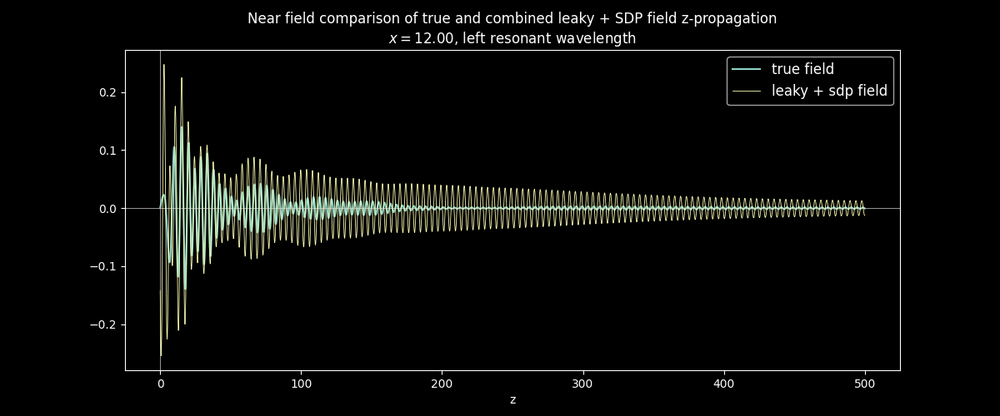

In [89]:
x0 = 12
fig, ax = A.plot_field_1d(fullL_z, xs=np.linspace(0, 500, 5000), label='true field', plot_Rhos=False) 
A.add_1d_plot(leaky_sdp_L_z, xs=np.linspace(0, 500, 5000), label='leaky + sdp field', lw=.6)
ax.set_title('Near field comparison of true and combined leaky + SDP field z-propagation\n$x=%.2f$, left resonant wavelength'%x0)
ax.set_xlabel('z')

(-0.04, 0.04)

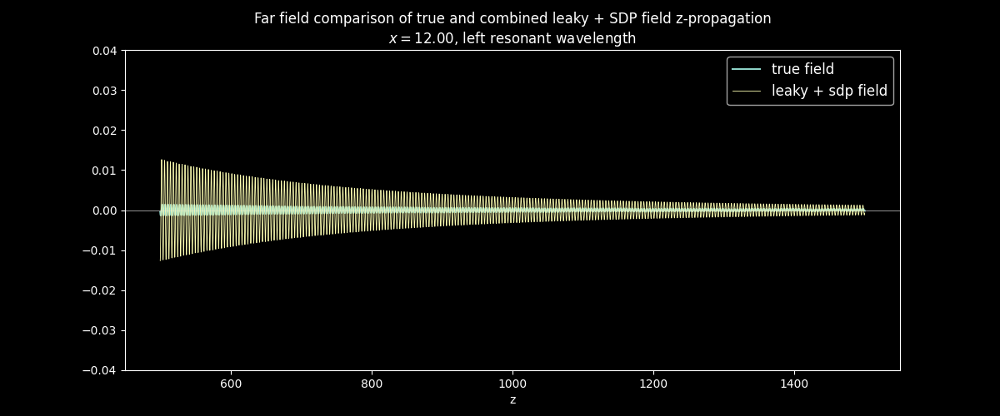

In [90]:
x0=12
fig, ax = A.plot_field_1d(fullL_z, xs=np.linspace(500, 1500, 5000), label='true field', plot_Rhos=False) 
A.add_1d_plot(leaky_sdp_L_z, xs=np.linspace(500, 1500, 5000), label='leaky + sdp field', lw=.6)
ax.set_title('Far field comparison of true and combined leaky + SDP field z-propagation\n$x=%.2f$, left resonant wavelength'%x0)
ax.set_xlabel('z')
ax.set_ylim(-.04, .04)

## z-Propagation Observations

- Combined leaky and SDP field does well to match far field in z-direction on the left side of the guide, but poorly on the right side, where it majorly overestimates the field.

- We either need to capture more of the space wave, which is only likely to be non-trivial near where the leaky modes cross it, or more leaky modes.
  
- Most likely explanation for this is that we need to get more leaky modes, so that combined field at the input end more closely matches $f_0$.  Right now, the match is worse on the right, which means the SDP is too big there, hence the overestimation further down.


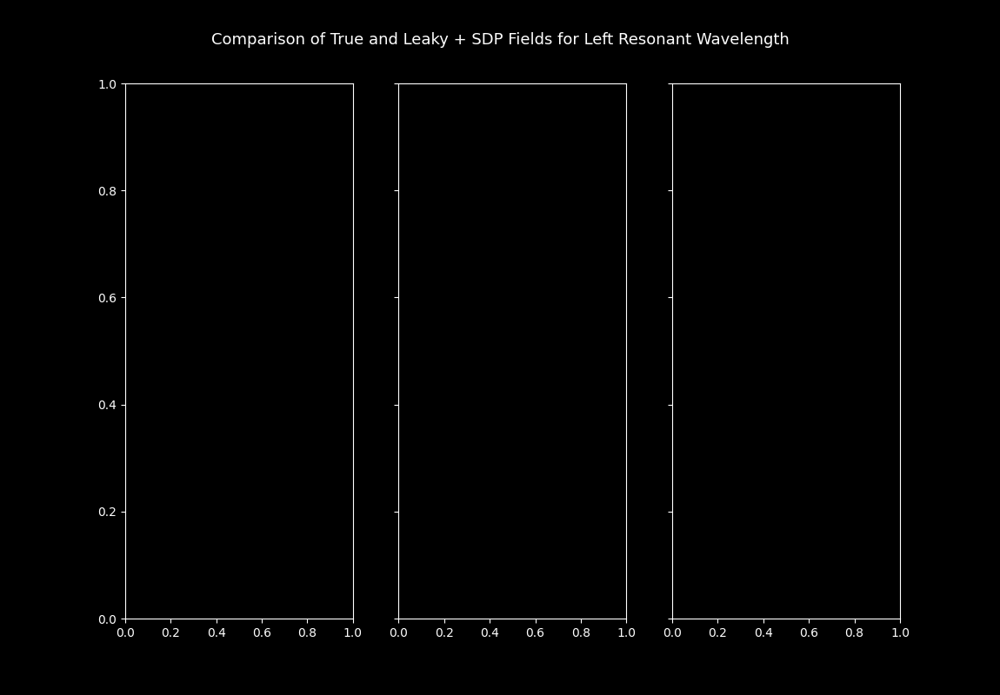

In [91]:
plt.close('all')
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, sharey=True, figsize=(11.5,8))

xs = np.linspace(-25, 25, 100)
zs = np.linspace(100, 240, 200)

vmin, vmax = -10, 10
Rho_lineargs = {'lw': .125, 'ls': '-', 'c': 'k'}
fig.suptitle('\nComparison of True and Leaky + SDP Fields for Left Resonant Wavelength\n', fontsize=13);

In [92]:
A.add_2d_plot(FullL, ax=ax1, xs=xs, zs=zs,
              # vmin=vmin, vmax=vmax, 
              levels=50, colorbar=True);
ax1.set_title('True Field')

Text(0.5, 1.0, 'True Field')

In [93]:
A.add_2d_plot(Leaky_Sdp_L, ax=ax2, xs=xs,
              # vmin=vmin, vmax=vmax,
              zs=zs,levels=50, colorbar=True);
ax2.set_title('Leaky + SDP Field')

Text(0.5, 1.0, 'Leaky + SDP Field')

In [94]:
A.add_2d_plot(Diff_Leaky_SDP_Full_L, ax=ax3, xs=xs, zs=zs,
              # vmin=vmin, vmax=vmax,
              part='norm', levels=50, colorbar=True);
ax3.set_title('Norm of Difference')

Text(0.5, 1.0, 'Norm of Difference')

## Left Resonant field Observations

- Leaky field still does overall a good job of representing propagation, though less well in the left side of the guide.

- SDP does complete the picture, but it's difficult to get a good visual comparison because of blow up of the SDP in the outer regions.

- If we took a lot more leaky modes it would mitigate this effect, but there are likely thousands of leaky modes between the real axis and SDP in this case, so might not be worth it.  Still might be worth investigating if just 10 or so more make a difference.

# Double resonance Propagate Radiation Field

In [95]:
Propagator_ClassD = D.propagator()

In [96]:
contour = D.real_contour(0.000001, D.Z_evanescent.real, 2200)

P_prop1De = Propagator_ClassD(contour, f0=f0, Lx=-b, Rx=b)
P_prop1Do = Propagator_ClassD(contour, f0=f0, Lx=-b, Rx=b, sign='-1')


(<Figure size 1100x400 with 1 Axes>, <Axes: >)

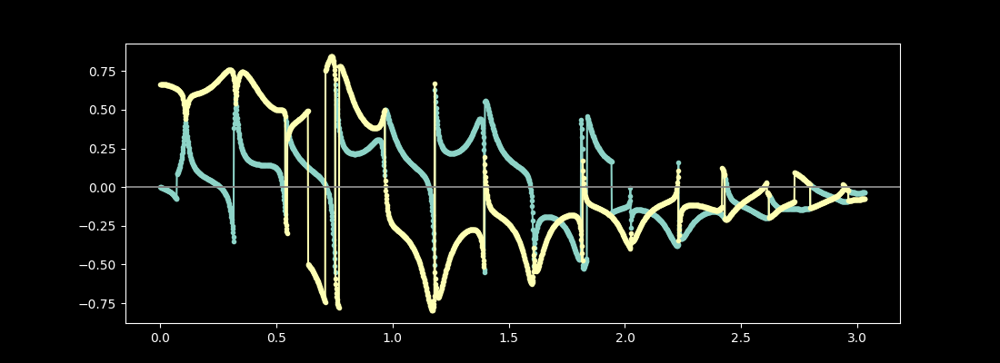

In [97]:
P_prop1De.plot_transform()
P_prop1Do.plot_transform(ax=plt.gca())

### Evanescent Portion

In [98]:
contour = D.real_contour(D.Z_evanescent.real, 3.3, 800)

P_ev1De = Propagator_ClassD(contour, f0=f0, Lx=-b, Rx=b)
P_ev1Do = Propagator_ClassD(contour, f0=f0, Lx=-b, Rx=b, sign='-1')


(<Figure size 1100x400 with 1 Axes>, <Axes: >)

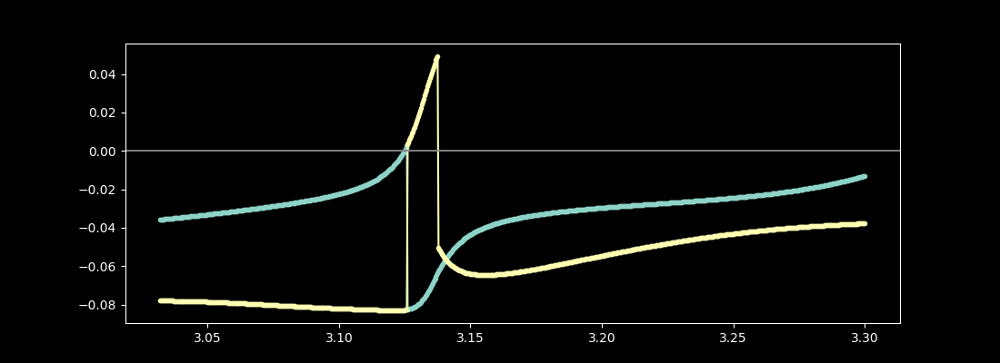

In [99]:
P_ev1De.plot_transform()
P_ev1Do.plot_transform(ax=plt.gca())

In [100]:
contour = D.real_contour(3.3, 7, 800)

P_ev2De = Propagator_ClassD(contour, f0=f0, Lx=-b, Rx=b)
P_ev2Do = Propagator_ClassD(contour, f0=f0, Lx=-b, Rx=b, sign='-1')


(<Figure size 1100x400 with 1 Axes>, <Axes: >)

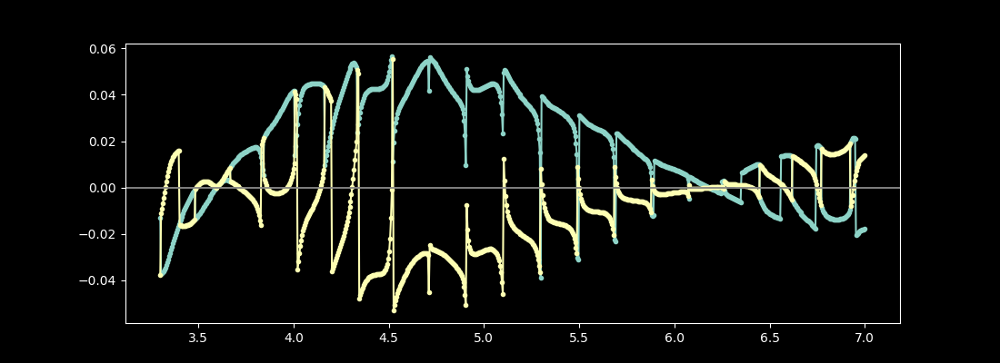

In [101]:
P_ev2De.plot_transform()
P_ev2Do.plot_transform(ax=plt.gca())

In [102]:
contour = D.real_contour(7, 14, 800)

P_ev3De = Propagator_ClassD(contour, f0=f0, Lx=-b, Rx=b)
P_ev3Do = Propagator_ClassD(contour, f0=f0, Lx=-b, Rx=b, sign='-1')


(<Figure size 1100x400 with 1 Axes>, <Axes: >)

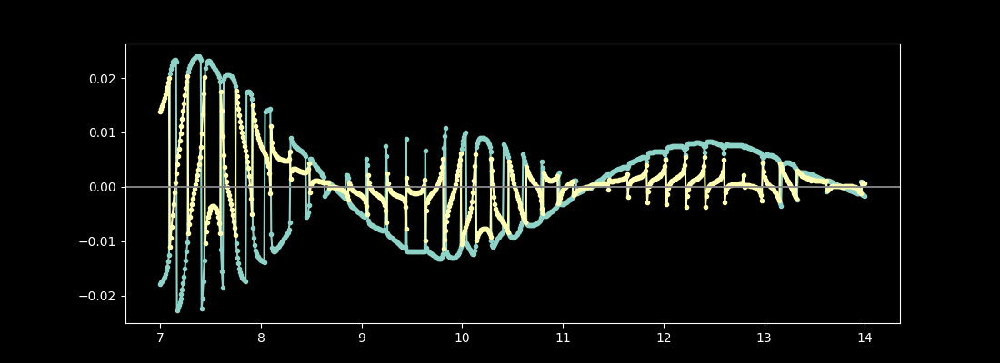

In [103]:
P_ev3De.plot_transform()
P_ev3Do.plot_transform(ax=plt.gca())

## Cross sections at input


In [104]:
propfuncsD = [
    P_prop1De,
    P_prop1Do,
]

evfuncsD = [
    P_ev1De,
    P_ev1Do,
    P_ev2De,
    P_ev2Do,
    P_ev3De,
    P_ev3Do,
]

In [105]:
x0 = 0
z0 = 0

propD_x = lambda x: sum([f.slice_propagate(x, z0, 'z') for f in propfuncsD])
evD_x = lambda x: sum([f.slice_propagate(x, z0, 'z') for f in evfuncsD]) 
fullD_x = lambda x: propD_x(x) + evD_x(x)

propD_z = lambda z: sum([f.slice_propagate(z, x0, 'x') for f in propfuncsD])
evD_z = lambda z: sum([f.slice_propagate(z, x0, 'x') for f in evfuncsD]) 
fullD_z = lambda z: propD_z(z) + evD_z(z)

diffD_x = lambda x: f0(x) - fullD_x(x)

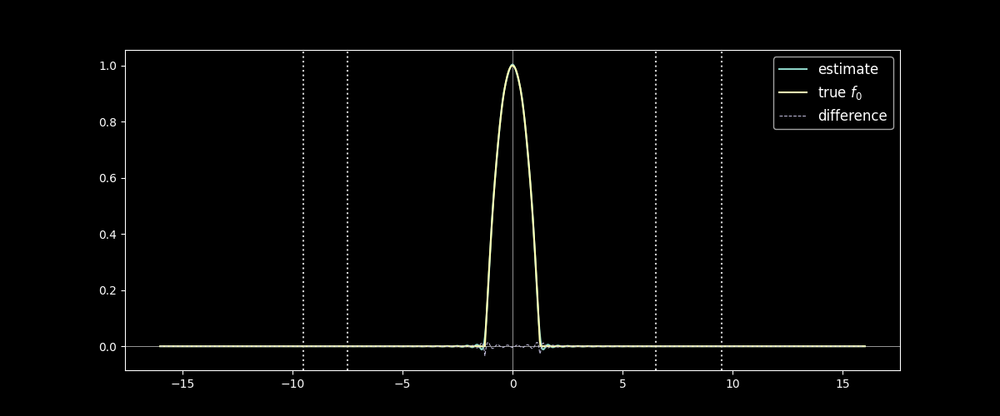

In [106]:
A.plot_field_1d(fullD_x, label='estimate') 
A.add_1d_plot(f0, label='true $f_0$')
A.add_1d_plot(diffD_x, label='difference', linewidth=.75, linestyle='--')
# plt.gca().set_xlim(-3,3)

In [107]:
PropD = lambda x, z: sum([f.propagate(x, z) for f in propfuncsD])
EvD = lambda x, z: sum([f.propagate(x, z) for f in evfuncsD]) 
FullD = lambda x, z: PropD(x, z) + EvD(x, z)

## Leaky modes

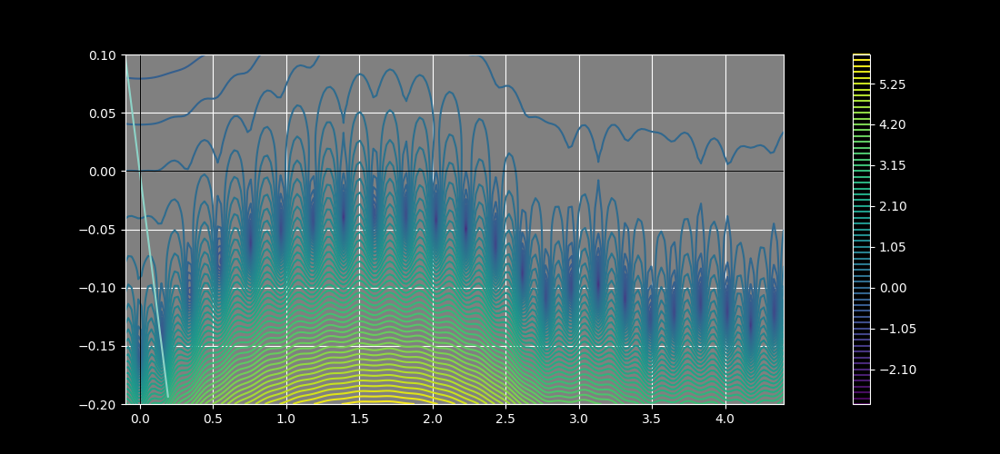

In [108]:
D.determinant_plot(-.1, 4.4, -.2, .1, plot_x_axis=True);

In [109]:
guesses_D = [
    # .09-.095j,
    .15-.14j,
    .35-.11j,
    .55-.08j,
    .75-.06j,
    .95-.05j,
    1.2-.04j,
    1.4-.04j,
    1.6-.04j,
    1.8-.04j,
    2.-.045j,
    2.2-.05j,
    2.4-.06j,
    2.6-.09j,
    2.8-.11j,
    2.95-.1j,
    3.12-.1j,
    3.3-.11j,
    3.5-.13j,
    3.65-.12j,
    3.82-.11j,
    4-.12j,
]

In [110]:
Z_leaky_D = [newton(D.determinant_Z, np.array(guess)) for guess in guesses_D]
for Z in Z_leaky_D:
    plt.plot(Z.real, Z.imag, marker='o', markersize=5)

In [111]:
P_leaky_D = [Propagator_ClassD(D.circular_contour(-Z, 1e-6, 5), f0=f0, Lx=-b, Rx=b) for Z in Z_leaky_D]
P_leaky_D.extend([Propagator_ClassD(D.circular_contour(-Z, 1e-6, 5), f0=f0, Lx=-b, Rx=b, sign=-1) for Z in Z_leaky_D])

In [112]:
x0 = 0
z0 = 0

leaky_D_x = lambda x: sum([P.slice_propagate(x, z0, 'z') for P in P_leaky_D])
leaky_D_z = lambda z: sum([P.slice_propagate(z, x0, 'x') for P in P_leaky_D])
Leaky_D = lambda x, z: sum([P.propagate(x, z) for P in P_leaky_D])

diff_leaky_full_D_x = lambda x: fullD_x(x) - leaky_D_x(x)
Diff_Leaky_Full_D = lambda x,z: FullD(x,z) - Leaky_D(x,z)

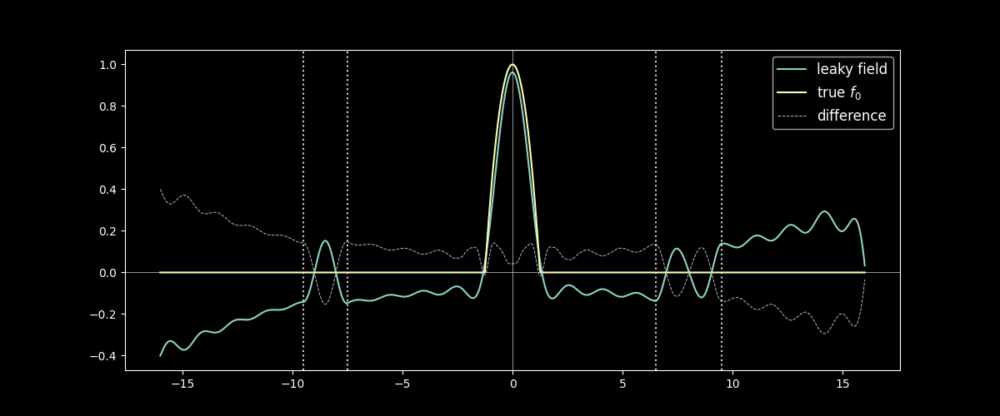

In [113]:
A.plot_field_1d(leaky_D_x, label='leaky field') 
A.add_1d_plot(f0, label='true $f_0$')
A.add_1d_plot(diff_leaky_full_D_x, label='difference', linestyle='--', lw=.7)
# plt.gca().set_xlim(-3,3)

Text(0.5, 0, 'z')

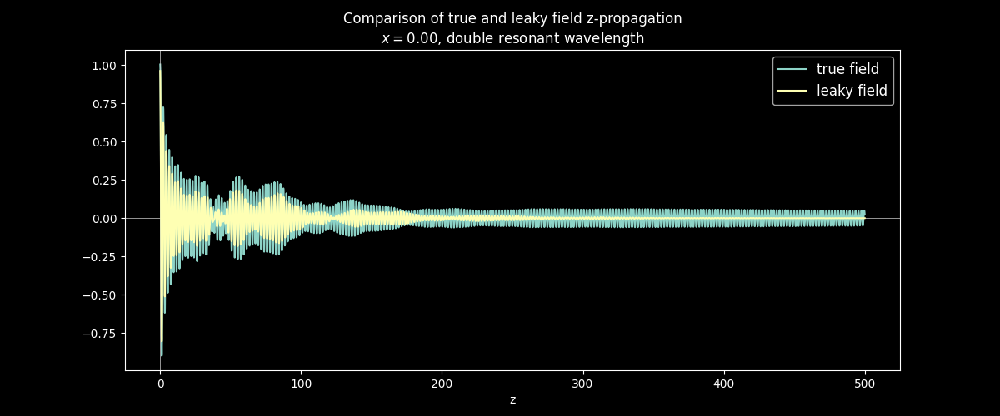

In [114]:
fig, ax = A.plot_field_1d(fullD_z, xs=np.linspace(0, 500, 5000), label='true field', plot_Rhos=False) 
A.add_1d_plot(leaky_D_z, xs=np.linspace(0, 500, 5000), label='leaky field')
ax.set_title('Comparison of true and leaky field z-propagation\n$x=%.2f$, double resonant wavelength'%x0)
ax.set_xlabel('z')

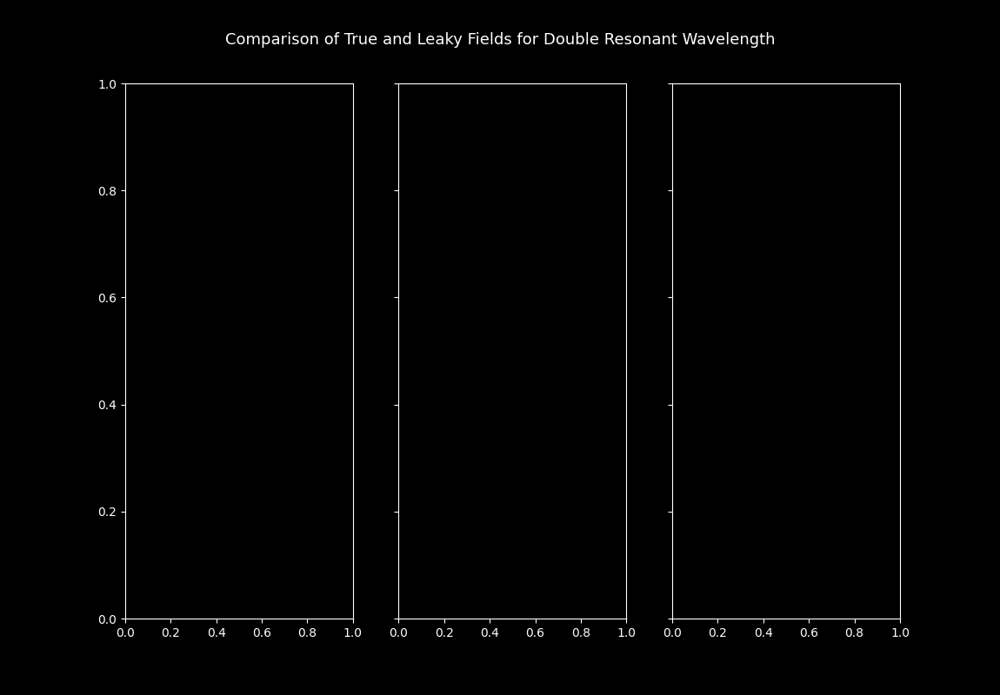

In [115]:
plt.close('all')
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, sharey=True, figsize=(11.5,8))

xs = np.linspace(-25, 25, 100)
zs = np.linspace(0, 140, 200)

vmin, vmax = -.8, .8
Rho_lineargs = {'lw': .125, 'ls': '-', 'c': 'k'}
fig.suptitle('\nComparison of True and Leaky Fields for Double Resonant Wavelength\n', fontsize=13);

In [116]:
A.add_2d_plot(FullD, ax=ax1, xs=xs, zs=zs,
              vmin=vmin, vmax=vmax,
              levels=50, colorbar=True);
ax1.set_title('True Field')

Text(0.5, 1.0, 'True Field')

In [117]:
A.add_2d_plot(Leaky_D, ax=ax2, xs=xs, zs=zs,
              vmin=vmin, vmax=vmax,
              levels=50, colorbar=True);
ax2.set_title('Leaky Field')

Text(0.5, 1.0, 'Leaky Field')

In [118]:
A.add_2d_plot(Diff_Leaky_Full_D, ax=ax3, xs=xs, zs=zs, part='norm', levels=50, colorbar=True);
ax3.set_title('Norm of Difference')

Text(0.5, 1.0, 'Norm of Difference')

## Space wave via SDP integration

In [119]:
contour = D.sdp_contour(0.000001, .155, 900, sdp_sign=-1)
P_sdp_D_1e = Propagator_ClassD(contour, f0=f0, Lx=-b, Rx=b)
P_sdp_D_1o = Propagator_ClassD(contour, f0=f0, Lx=-b, Rx=b, sign=-1)

(<Figure size 1100x400 with 1 Axes>, <Axes: >)

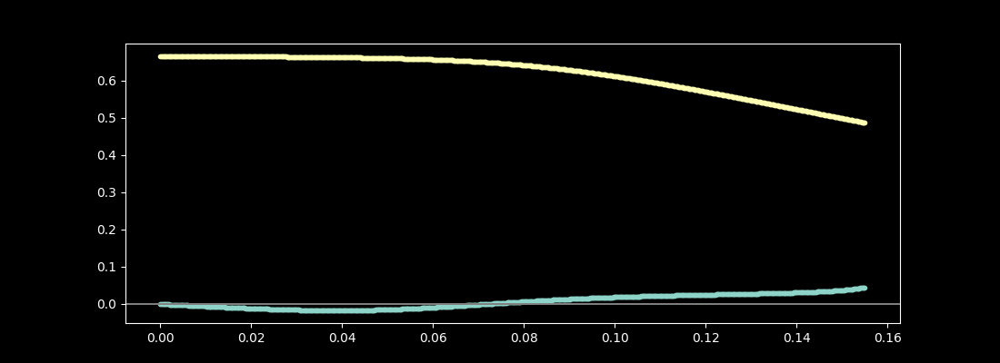

In [120]:
P_sdp_D_1e.plot_transform()
P_sdp_D_1o.plot_transform(ax=plt.gca())

In [121]:
contour = D.sdp_contour(.155, .17, 1200, sdp_sign=-1)
P_sdp_D_2e = Propagator_ClassD(contour, f0=f0, Lx=-b, Rx=b)
P_sdp_D_2o = Propagator_ClassD(contour, f0=f0, Lx=-b, Rx=b, sign=-1)

(<Figure size 1100x400 with 1 Axes>, <Axes: >)

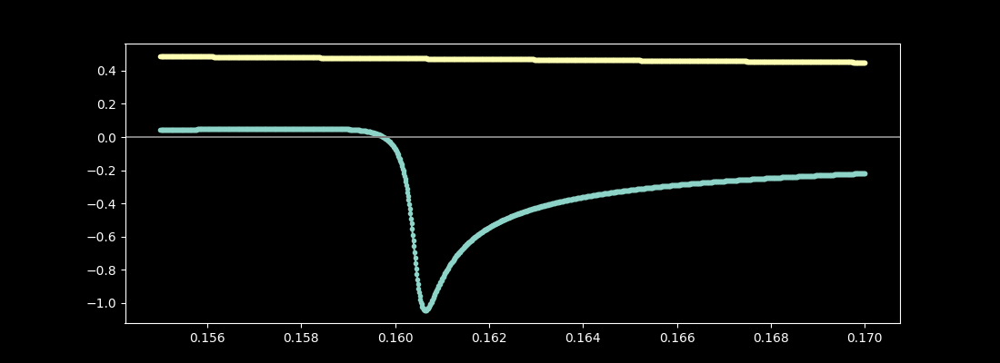

In [122]:
P_sdp_D_2e.plot_transform()
P_sdp_D_2o.plot_transform(ax=plt.gca())

In [123]:
contour = D.sdp_contour(.17, 1, 500, sdp_sign=-1)
P_sdp_D_3e = Propagator_ClassD(contour, f0=f0, Lx=-b, Rx=b)
P_sdp_D_3o = Propagator_ClassD(contour, f0=f0, Lx=-b, Rx=b, sign=-1)

(<Figure size 1100x400 with 1 Axes>, <Axes: >)

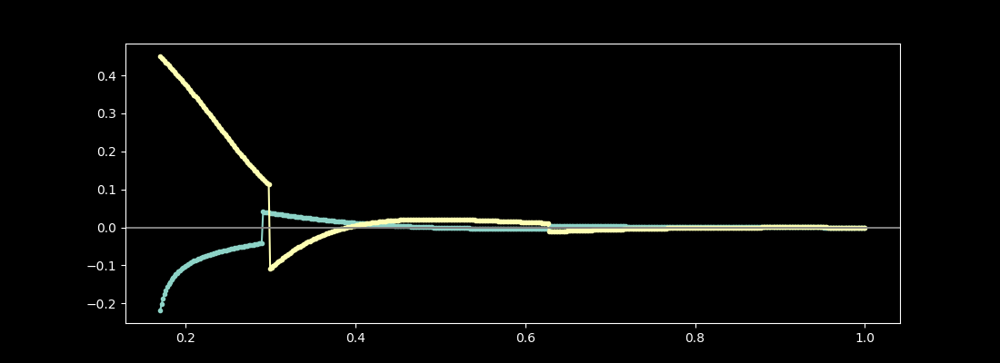

In [124]:
P_sdp_D_3e.plot_transform()
P_sdp_D_3o.plot_transform(ax=plt.gca())

In [125]:
P_sdps_D = [
    P_sdp_D_1e,
    P_sdp_D_1o,
    P_sdp_D_2e,
    P_sdp_D_2o,
    P_sdp_D_3e,
    P_sdp_D_3o,
]

In [126]:
x0 = 10
z0 = 0

sdp_D_x = lambda x: sum([P.slice_propagate(x, z0, 'z') for P in P_sdps_D])
sdp_D_z = lambda z: sum([P.slice_propagate(z, x0, 'x') for P in P_sdps_D])
Sdp_D = lambda x, z: sum([P.propagate(x, z) for P in P_sdps_D])

leaky_sdp_D_x = lambda x: leaky_D_x(x) + sdp_D_x(x)
leaky_sdp_D_z = lambda z: leaky_D_z(z) + sdp_D_z(z)
Leaky_Sdp_D = lambda x, z: Leaky_D(x,z) + Sdp_D(x, z)

Diff_Leaky_SDP_Full_D = lambda x,z: FullD(x,z) - Leaky_Sdp_D(x,z)

(-3.0, 3.0)

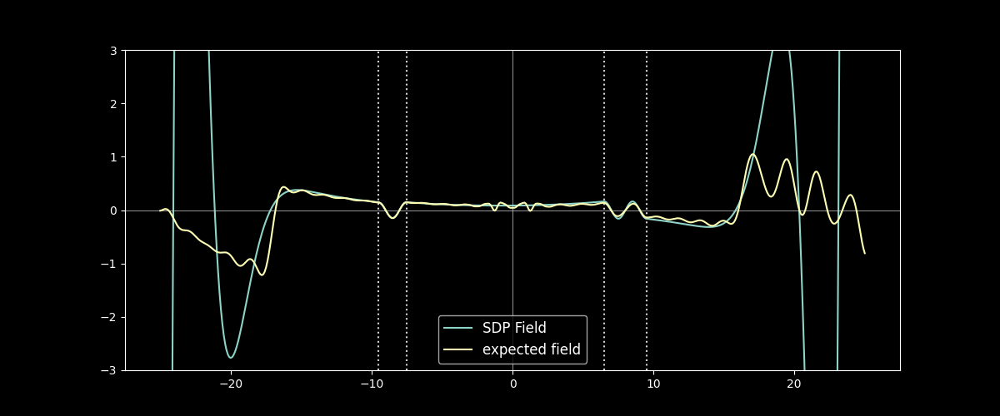

In [127]:
L.plot_field_1d(sdp_D_x, xs=np.linspace(-25, 25, 500), label='SDP Field')
L.add_1d_plot(diff_leaky_full_D_x, xs=np.linspace(-25, 25, 500), label='expected field')
plt.gca().set_ylim(-3,3)

### Right side Leaky + SDP for double resonance

Text(0.5, 0, 'z')

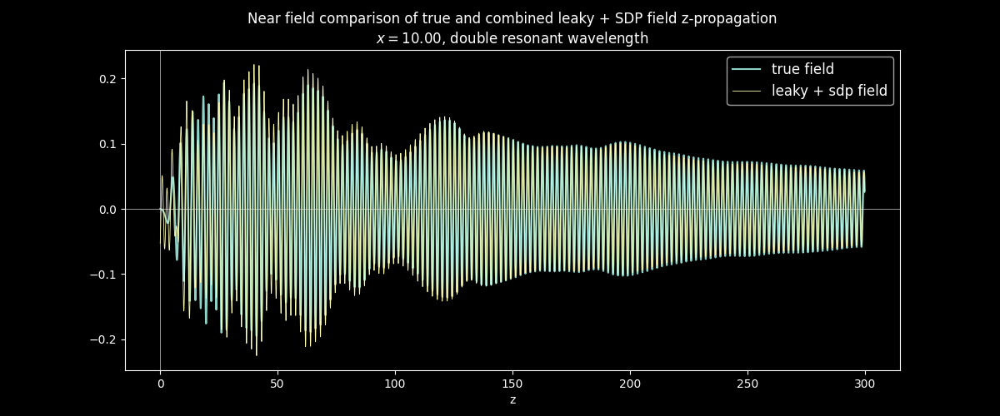

In [128]:
x0=10
fig, ax = A.plot_field_1d(fullD_z, xs=np.linspace(0, 300, 5000), label='true field', plot_Rhos=False) 
A.add_1d_plot(leaky_sdp_D_z, xs=np.linspace(0, 300, 5000), label='leaky + sdp field', lw=.6)
ax.set_title('Near field comparison of true and combined leaky + SDP field z-propagation\n$x=%.2f$, double resonant wavelength'%x0)
ax.set_xlabel('z')

(-0.1, 0.1)

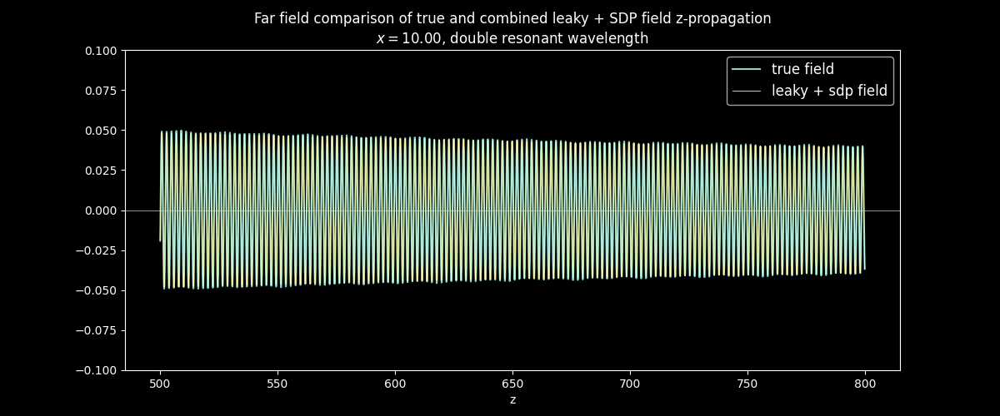

In [129]:
fig, ax = A.plot_field_1d(fullD_z, xs=np.linspace(500, 800, 5000), label='true field', plot_Rhos=False) 
A.add_1d_plot(leaky_sdp_D_z, xs=np.linspace(500, 800, 5000), label='leaky + sdp field', lw=.6)
ax.set_title('Far field comparison of true and combined leaky + SDP field z-propagation\n$x=%.2f$, double resonant wavelength'%x0)
ax.set_xlabel('z')
ax.set_ylim(-.1, .1)

### Left side Leaky + SDP for double resonance

Text(0.5, 0, 'z')

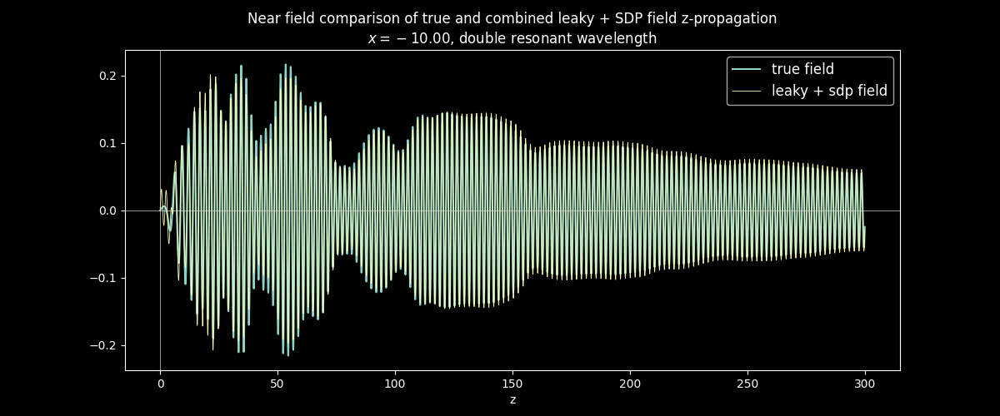

In [134]:
x0=-10
fig, ax = A.plot_field_1d(fullD_z, xs=np.linspace(0, 300, 5000), label='true field', plot_Rhos=False) 
A.add_1d_plot(leaky_sdp_D_z, xs=np.linspace(0, 300, 5000), label='leaky + sdp field', lw=.6)
ax.set_title('Near field comparison of true and combined leaky + SDP field z-propagation\n$x=%.2f$, double resonant wavelength'%x0)
ax.set_xlabel('z')

(-0.1, 0.1)

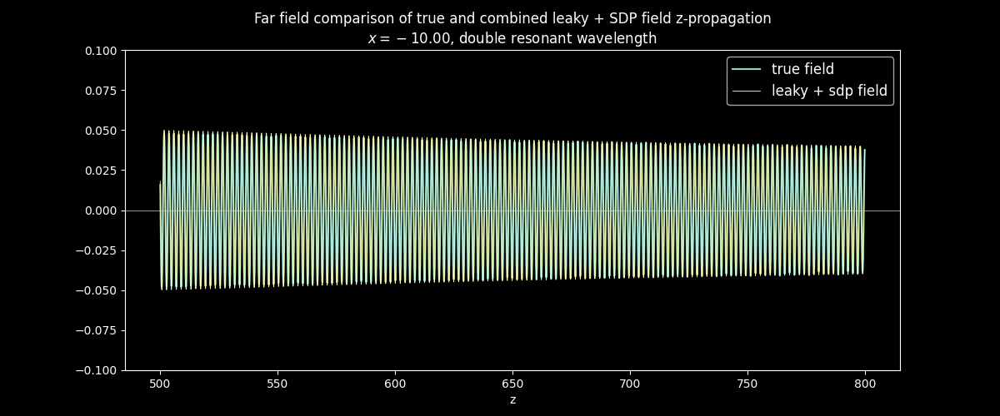

In [135]:
x0=-10
fig, ax = A.plot_field_1d(fullD_z, xs=np.linspace(500, 800, 5000), label='true field', plot_Rhos=False) 
A.add_1d_plot(leaky_sdp_D_z, xs=np.linspace(500, 800, 5000), label='leaky + sdp field', lw=.6)
ax.set_title('Far field comparison of true and combined leaky + SDP field z-propagation\n$x=%.2f$, double resonant wavelength'%x0)
ax.set_xlabel('z')
ax.set_ylim(-.1, .1)

## Double Resonance z-propagation Observations

- The combined SDP and Leaky fields now approximate the true fields well on both the left and right outer regions.  This is in contrast to the one-sided resonance, where the combined fields only approximated the true fields well on the left side (the resonant side), while overestimatin the true fields on the right (non-resonant) side.

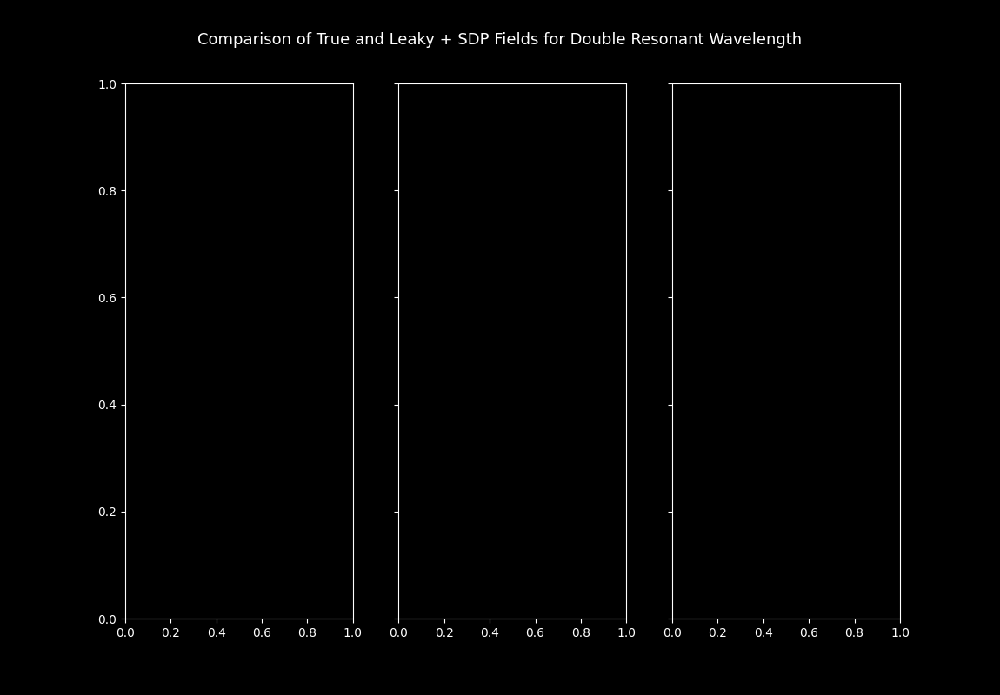

In [136]:
plt.close('all')
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, sharey=True, figsize=(11.5,8))

xs = np.linspace(-15, 15, 100)
zs = np.linspace(0, 140, 200)

vmin, vmax = -1, 1
Rho_lineargs = {'lw': .125, 'ls': '-', 'c': 'k'}
fig.suptitle('\nComparison of True and Leaky + SDP Fields for Double Resonant Wavelength\n', fontsize=13);

In [137]:
A.add_2d_plot(FullD, ax=ax1, xs=xs, zs=zs,
              vmin=vmin, vmax=vmax, 
              levels=50, colorbar=True);
ax1.set_title('True Field')

Text(0.5, 1.0, 'True Field')

In [138]:
A.add_2d_plot(Leaky_Sdp_D, ax=ax2, xs=xs,
              vmin=vmin, vmax=vmax,
              zs=zs,levels=50, colorbar=True);
ax2.set_title('Leaky + SDP Field')

Text(0.5, 1.0, 'Leaky + SDP Field')

In [139]:
A.add_2d_plot(Diff_Leaky_SDP_Full_D, ax=ax3, xs=xs, zs=zs,
              # vmin=vmin, vmax=vmax,
              part='norm', levels=50, colorbar=True);
ax3.set_title('Norm of Difference')

Text(0.5, 1.0, 'Norm of Difference')